In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# Chargement des librairies
import datetime
import time
import sys
import os
import string
import json
from datetime import datetime
import jyquickhelper
import numpy as np
import pandas as pd
import joblib
sys.modules['sklearn.externals.joblib'] = joblib
import six
import sys
sys.modules['sklearn.externals.six'] = six
import outils_data
import outils_nlp
import outils_visu
import outils_acp
import outils_segmentation
import matplotlib as mpl
import matplotlib.pyplot as plt
# Feature extraction
import seaborn as sns
import sklearn
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer, \
    HashingVectorizer
# Traitement de text
import texthero as hero
from texthero import preprocessing
import nltk
from nltk.corpus import stopwords
from nltk import word_tokenize, FreqDist
from stop_words import get_stop_words
from gensim.models import Word2Vec

# Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline
# Chargement à chaud des librairies personnelles
%load_ext autoreload
%autoreload 2
# Valide code pep8
# %load_ext pycodestyle_magic
# %pycodestyle_on
# %pycodestyle_off
#Activating extension for Jupyter notebook
import lux
#!jupyter nbextension install --py luxwidget
#!jupyter nbextension enable --py luxwidget

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# <span class="bg-primary">POC CLASSIFICATION<span>
##  <span style='background:PaleGreen'>PARTIE 1 : ANALYSE - NETTOYAGE - PREPARATION </span>
##  <span style='background:PaleGreen'>PREMIERS ESSAIS AVEC RIVER </span>

## <span style='background:Thistle'>Mission</span> 
***
- Notre mission est d'automatiser la classification de documents ajoutés par le client à partir :
    - [x] **des descriptions textuelles des documents**,
    - [x] **des titres des documents**
mis à disposition dans le jeu de données.
- Une colonne cible contenant la référence des différents types de documents a été ajoutée par nos soins :
    - [x] **labels**

## <span style='background:Thistle'>Sommaire du notebook</span> 

In [15]:
from jyquickhelper import add_notebook_menu
add_notebook_menu()

## <span style='background:Thistle'>Versions</span> 

In [4]:
# Versions
print('Version des librairies utilisées :')
print('jyquickhelper         : ' + jyquickhelper.__version__)
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Matplotlib            : ' + mpl.__version__)
print('Seaborn               : ' + sns.__version__)
print('Sklearn               : ' + sklearn.__version__)
print('Outils dataframe      : ' + outils_data.__version__)
print('Outils NLP            : ' + outils_nlp.__version__)
print('Outils visualisation  : ' + outils_visu.__version__)
print('Outils ACP            : ' + outils_acp.__version__)
print('Outils SEGMENTATION   : ' + outils_segmentation.__version__)
now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
jyquickhelper         : 0.4.220
Python                : 3.8.5 (default, Sep  3 2020, 21:29:08) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.21.2
Pandas                : 1.3.3
Matplotlib            : 3.3.2
Seaborn               : 0.11.0
Sklearn               : 0.24.0
Outils dataframe      : 0.0.2
Outils NLP            : 0.0.0
Outils visualisation  : 0.0.2
Outils ACP            : 0.0.1
Outils SEGMENTATION   : 0.0.0
Lancé le           : 2021-10-12T18:25:42.293364


## <span style='background:Thistle'>Options</span> 

In [10]:
dico_pd_option = {
    'display.max_rows': 2500,
    'display.max_column': 200,
    'display.width': 300,
    'display.precision': 5,
    'display.max_colwidth': 1000,
    'mode.chained_assignment': None
}
for cle, val in dico_pd_option.items():
    pd.set_option(cle, val)

In [6]:
# Nombre aléatoire pour la reproductibilité des résultats
seed = 21

## <span class="bg-info">1. Chargement du jeu de données transformé en CSV</span>

In [4]:
data = pd.read_csv('POC_IA_Classification_labelsOK.csv', index_col=0)

In [5]:
data.shape, data.columns

((1394, 4), Index(['title', 'id', 'texte', 'label'], dtype='object'))

In [6]:
# Taille : nombre de lignes/colonnes
nRow, nVar = data.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 1394 lignes et 4 variables.


In [10]:
data.head(1)

,title,id,texte,label
0,2004-CP101-#SY2004.1-#D201700-CONVOC AGO-Convocation AG 20-09-17.pdf,614b23813caeb55fc4991885,"\n\n \n\n7 ADRESSE IMMEUBLE -\n\nAFUT, MURAT\n\n4-22 PLACE DES MAITRES VIGNERONS\n92506 RUEIL MALMATSON\n\nMANDAT MEMBRE AFUL\n\nOGIF\n18 BIS RUE DE VILLIERS\n\n \n\n92594 LEVALLOIS-PERRET\n\n \n\n \n\n \n\n \n\nPOUVOIR\n\nJe soussigné{a)\n\nagissant en qualité de copropriétaire de l'immeuble précité constitue pour\nmandataire\n\nou à son défaut :\n\npour me représenter à l'assemblée générale : AFUL MURAT\n\npour le 20 SEPTEMBRE 2017\n\n| En conséquence, assister à l'assemblée, signer ies feuilles de\nprésence et toutes autres Pièces, prendre part À toutes les délibérations, émettre\n\ntous votes, sur les questions mentionnées à l'ordre du jour et généralement faire\nle nécessaire.\n\nIL est rappelé que le syndic ne peut pas représenter un copropriétaire et que\nchacun des copropriétaires ne peut recevoir que trois pouvoirs, Il peut recevoir\n\nplus de trois pouvoirs si 1e total des voix dont il dispose n'excède pas 5 % des\nvoix du syndicat.\n\nLe\nFaire précéder la signature de\...",CP101
1,1517-CP101-#SY1517.1-#D201900-CONVOC_AGO_20190624.pdf,614b23823caeb55fc499188c,"RECOMMANDEE AR. | de IMMEUBLE\n\n> Convocation à l’Assemblée générale ordinaire\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se\n\ntiendra le :\nLundi 24 Juin 2019à 18 H 00\n\nFONCIA SEINE OUEST\n10 RUE MAURICE BOKANOSWKI\n92600 ASNIERES-SUR-SEINE\n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. A défaut\nde majorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais\nsupplémentaires supportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Assemblée Générale, il vous est possible de vous y faire représenter\nà l'aide du pouvoir joint. Nous vous rappelons à ce sujet que le syndic ou son représentant ne peut\nrecevoir de pouvoir à son nom, en blanc et en faire utilisation, qu'un mandataire peut recevoir plus de\ntrois pouvoirs si le total des voix ...",CP101
2,2030-CP101-#SY2030.1-#D201800-CONVOC AGO-Convoc AG 140518.pdf,614b239d3caeb55fc49918be,"\n\nRECOMMANDEE AR. IMMEUBLE\nLES DOMES RST\n\n2-4 RUE DES HAUTS DE CHANTURGUE\n30 RUE DU TORPILLEUR SIROCCO\n63100 CLERMONT-FERRAND\n\n> Convocation à l’Assemblée générale Annuelle <\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se tiendra\n\nle :\nLundi 14 Mai 2018 à 18 H 00\n\nSite LECLANCHE (salle 1)\nRue de Champratel\n63100 CLERMONT FERRAND\n\n \n\nREC""\n13 AVR, 2018\n\na |\n\n \n \n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nLes 7-16-17-21 résolutions nécessitent la majorité de l'article 25-1 de la loi.\nLes10-11-12-13 résolutions nécessitent la majorité de l'article 25 de la loi.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. À défaut de\nmajorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais supplémentaires\nsupportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Asse...",CP101
3,6352-CP101-#D201500-CONVOC AGO-4042.1-6352.1-Convocation AG RESIDENCE 3.04.15.pdf,614b239f3caeb55fc49918cd,"\n\n \n\n \n\nREGU\n\n \n\n \n \n\nTRAVAILLER EN TOUTE T\n\nle\n\n14 MARS 2015\nRÉQ sausnzs\n\nep ses NE\n\nTE\n\nRANSPARENCE, GEST ES\n\nSENTIEL,\n\nCompte-rendu de gestion annuel\n\n03 Mars 2015\n\nImmeuble\n\nRESIDENCE LES SABLONS-NOTRE DA\n1 À 20 RUE DES SABLONS 18 À 36 RUE DE LA\nBERTHIE 95870 BEZONS\n\n \n\nff 7] WA FONCIA cos\n\nConseil syndical\nM. BESTANT\n\nM. BITAR\n\nM BRANCO CALADO\n\nM DROUET/LATTE\n\n© MEL HARNANE\n\nM FRANCOÏS/ELIENT\nM LEGRAND\n\nM REDDAF\n\nHE\n\nL' iMinabliler clair, net 3 pr écis\n\nVos interlocuteurs FONCIA\n\nJean-Michel PIMONT\nDirecteu

## <span class="bg-info">2. Description du jeu de données</span>

### <span class="bg-success">2_1 Chargement du jeu de données et analyse pré-exploratoire</span>

In [7]:
# Vue d'ensemble du jeu de données
outils_data.resume_datasets([data], ['Data'])

Les données se décomposent en 1 fichier(s)


Jeu de données,Nb lignes,Nb variables,Nb nan,Nb var avec nan,Var avec nan
Data,1394,4,0,0,


-------------------------------------------------------------
Type de variable pour chacune des variables



title    object
id       object
texte    object
label    object
dtype: object

,Nombre par type de variable,% des types de variable
object,4,100.00000


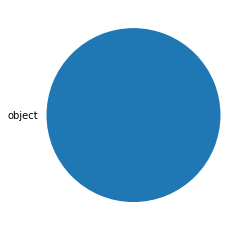

In [8]:
# Types des variables
outils_data.get_types_variables(data, True, True, True)

In [9]:
# Résumé des variables
desc_data = outils_data.description_variables(data)
desc_data

,title,id,texte,label
type,object,object,object,object
nb_nan,0.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0
count,1394,1394,1394,1394
unique,1385,1394,1387,11
top,2938-CP201-#SY2938.1-#D20201211-PV AGO.pdf,614b23813caeb55fc4991885,"Bonjour S.N.R [74],\n\nVous venez d’accepter une lettre recommandée électronique transmise par Oralia le 26/03/2019.\n\n\nNous vous informons qu'un document relatif à votre Copropriété a été déposé par Oralia sur votre\nespace privé.\n\nVous pouvez accuser réception du document par l'adresse suivante : Lien\n\nou directement depuis votre espace client sur le site www.oralia.fr.\n\nRecevez nos meilleures salutations\n\n\nVotre syndic Oralia\n\nCeci est un message automatique generé par la plateforme Paragon-Odyssee3.\n\nMerci de ne pas y repondre !",pvcp201
freq,2,1,3,833


In [14]:
data.dtypes.value_counts()

object    4
dtype: int64

In [15]:
data.describe()

,title,id,texte,label
count,1394,1394,1394,1394
unique,1385,1394,1387,11
top,2938-CP201-#SY2938.1-#D20201211-PV AGO.pdf,614b23813caeb55fc4991885,"Bonjour S.N.R [74],\n\nVous venez d’accepter une lettre recommandée électronique transmise par Oralia le 26/03/2019.\n\n\nNous vous informons qu'un document relatif à votre Copropriété a été déposé par Oralia sur votre\nespace privé.\n\nVous pouvez accuser réception du document par l'adresse suivante : Lien\n\nou directement depuis votre espace client sur le site www.oralia.fr.\n\nRecevez nos meilleures salutations\n\n\nVotre syndic Oralia\n\nCeci est un message automatique generé par la plateforme Paragon-Odyssee3.\n\nMerci de ne pas y repondre !",pvcp201
freq,2,1,3,833


In [16]:
data["label"].nunique()

11

In [17]:
data["label"].unique()

array(['CP101', 'CP103', 'cp102', 'cp104', 'pvcp201', 'pvcp202',
       'pvcp203', 'pvcp204', 'pvcp301', 'pvcp501', 'pvcp601'],
      dtype=object)

### <span class="bg-success">2_2 Valeurs manquantes</span>

Visualisation des données du dataset (en noir) et des valeurs manquantes (en saumon)

Valeurs manquantes :0 NaN pour 5576 données (0.0 %)
-------------------------------------------------------------
Nombre et pourcentage de valeurs manquantes par variable



,Nombres de valeurs manquantes,% de valeurs manquantes


-------------------------------------------------------------
Heatmap de visualisation des valeurs manquantes


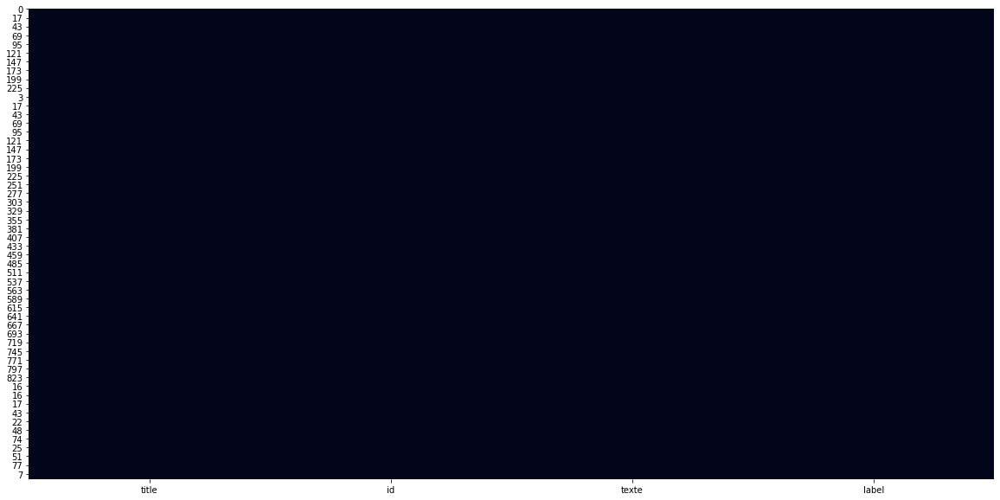

In [18]:
# Valeurs manquantes
outils_data.get_missing_values(data, True, True)

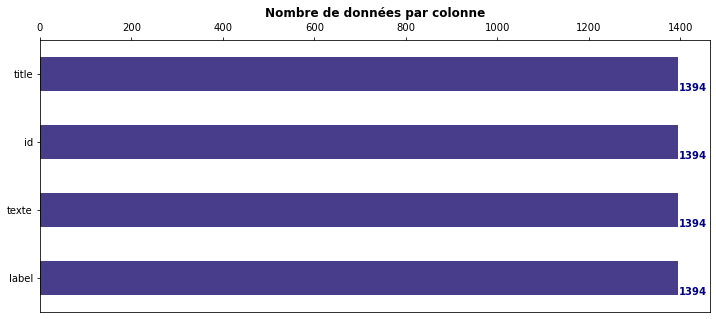

In [19]:
val_manquantes = data.count()
val_manquantes.sort_values(ascending=False, inplace=True)
fig, ax = plt.subplots(figsize=(12, 5))
val_manquantes.plot.barh(ax=ax, color='darkslateblue')
plt.gca().invert_yaxis()
ax.set_title("Nombre de données par colonne", fontweight='bold')
ax.xaxis.tick_top()
for i, v in enumerate(val_manquantes):
    ax.text(v + 3, i + .25, str(v), color='navy', fontweight='bold')

In [20]:
data['label'] = data['label'].fillna("").apply(
    lambda s: s.split(',') if s != "" else [])
labels_compteurs = {}
for lst in data['label']:
    for labels in lst:
        if labels:
            if labels in labels_compteurs:
                labels_compteurs[labels] += 1
            else:
                labels_compteurs[labels] = 1
sorted_labels_compteurs = sorted(
    labels_compteurs, key=labels_compteurs.get, reverse=True)

nombre_fois_present = data['label'].value_counts()
modalites = nombre_fois_present.index
tab = pd.DataFrame(modalites, columns = ['label'])
tab['Nombre'] = nombre_fois_present.values
tab['Fréquence'] = tab['Nombre']/len(data)
tab.head(10)

,label,Nombre,Fréquence
0,[pvcp201],833,0.59756
1,[CP101],240,0.17217
2,[pvcp501],96,0.06887
3,[pvcp301],75,0.05380
4,[pvcp204],47,0.03372
5,[pvcp202],26,0.01865
6,[pvcp203],25,0.01793
7,[pvcp601],23,0.01650
8,[cp102],12,0.00861
9,[cp104],12,0.00861


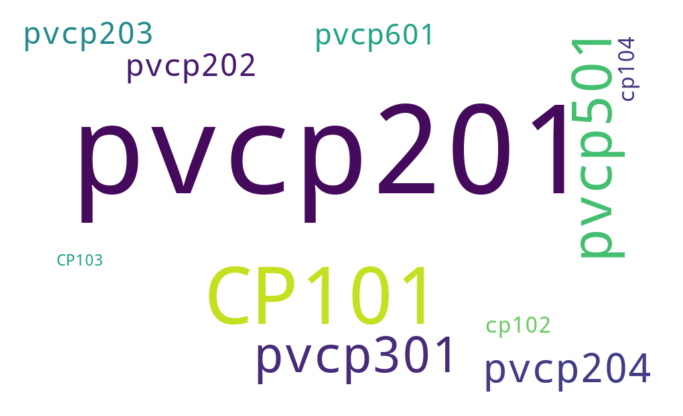

In [21]:
from wordcloud import WordCloud, ImageColorGenerator
wordcloud = WordCloud(width=1000, height=600, background_color="white", max_words=100).generate_from_frequencies(labels_compteurs)
plt.figure(figsize=(12,10))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

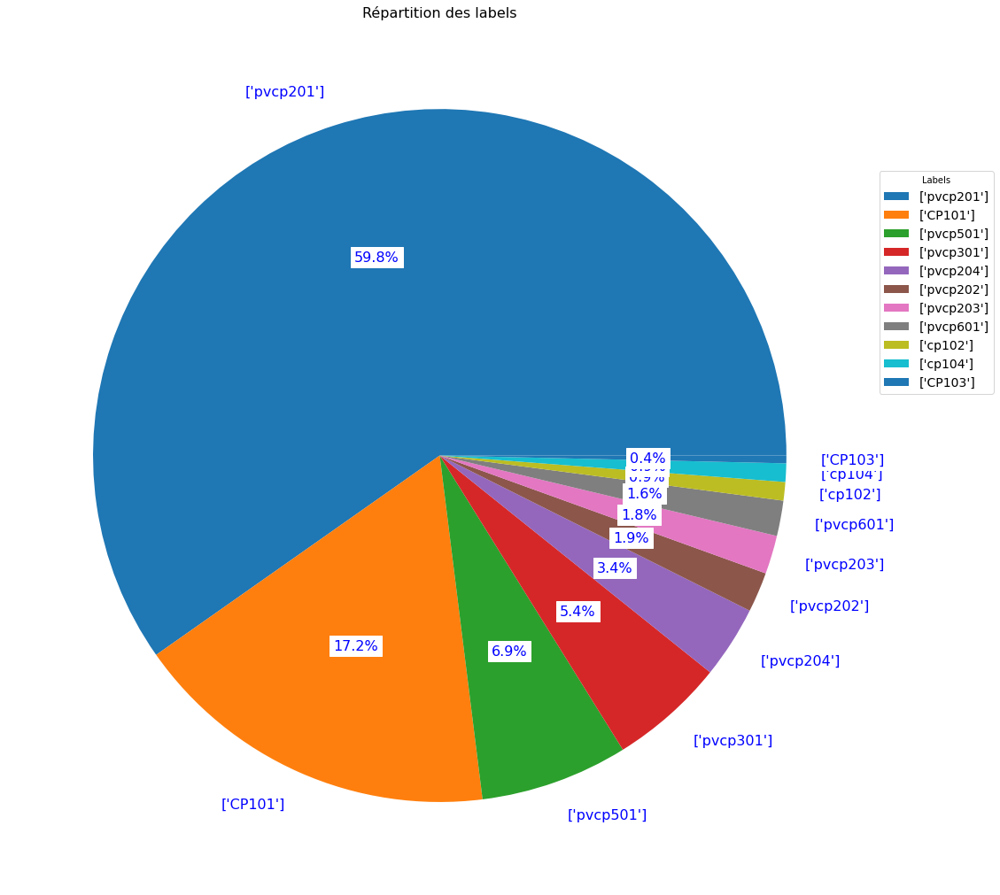

In [22]:
plt.figure(figsize=(18,18))
plt.title('Répartition des labels', size=16)
wedges, texts, autotexts = plt.pie(data.label.value_counts().values, labels = data.label.value_counts().index, autopct='%1.1f%%', textprops={'fontsize': 16, 'color' : 'b', 'backgroundcolor' : 'w'})
ax = plt.gca()
ax.legend(wedges, data.label.value_counts().index,title="Labels",loc="center left",fontsize=14,bbox_to_anchor=(1, 0.2, 0.5, 1))
plt.show()

In [6]:
data = pd.read_csv('POC_IA_Classification_labelsOK.csv',index_col=0)

In [7]:
df_texte_label = data.filter(items = ['label', 'texte'])
df_texte_label

Button(description='Toggle Pandas/Lux', layout=Layout(top='5px', width='140px'), style=ButtonStyle())

Output()

### <span class="bg-success">2_3 Nombre de textes par label</span>

In [8]:
dftxt_label = df_texte_label.groupby('label').agg({'texte':'count'})
dftxt_label

Button(description='Toggle Pandas/Lux', layout=Layout(top='5px', width='140px'), style=ButtonStyle())

Output()

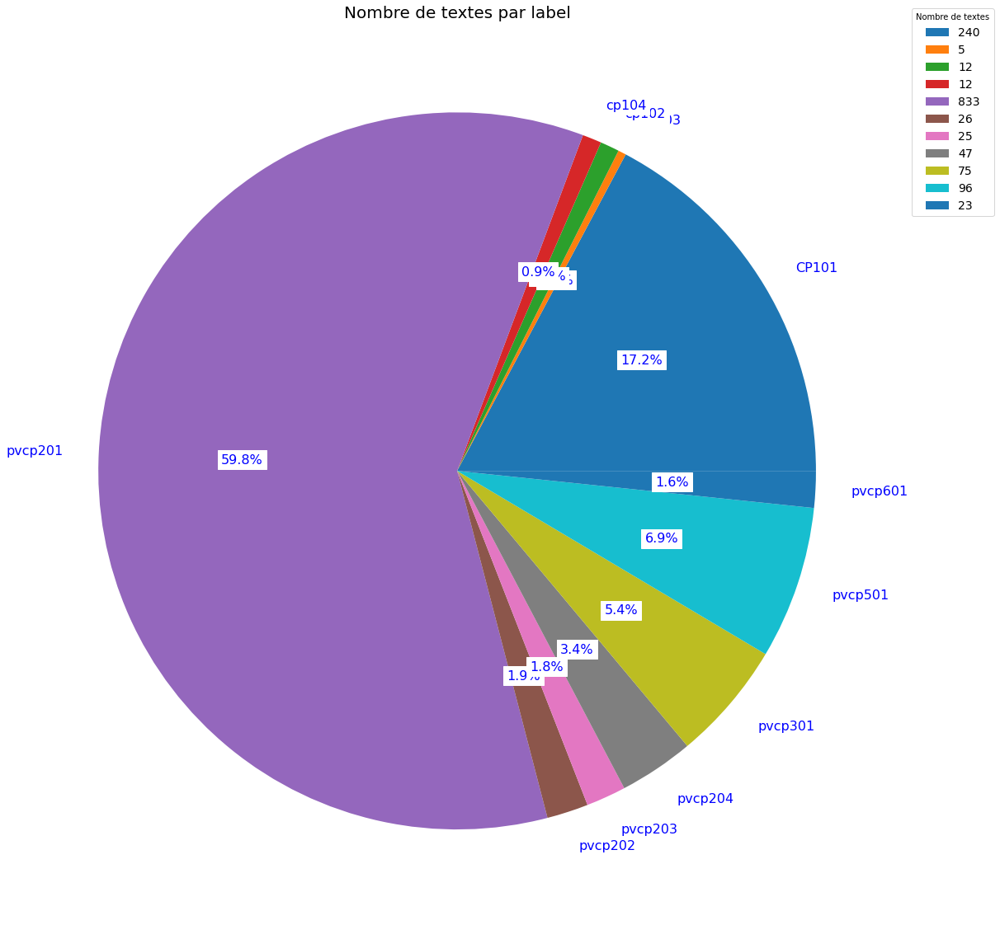

In [26]:
dftxt_label = dftxt_label.reset_index()
plt.figure(figsize=(20,20))
plt.title('Nombre de textes par label', size=20)
wedges, texts, autotexts = plt.pie(dftxt_label.texte, labels = dftxt_label.label, autopct='%1.1f%%', textprops={'fontsize': 16, 'color' : 'b', 'backgroundcolor' : 'w'})
ax = plt.gca()
ax.legend(wedges, dftxt_label.texte,title="Nombre de textes",loc="center left",fontsize=14,bbox_to_anchor=(1, 0.4, 0.5, 1))
plt.show()

In [9]:
dftxt_label

Button(description='Toggle Pandas/Lux', layout=Layout(top='5px', width='140px'), style=ButtonStyle())

Output()

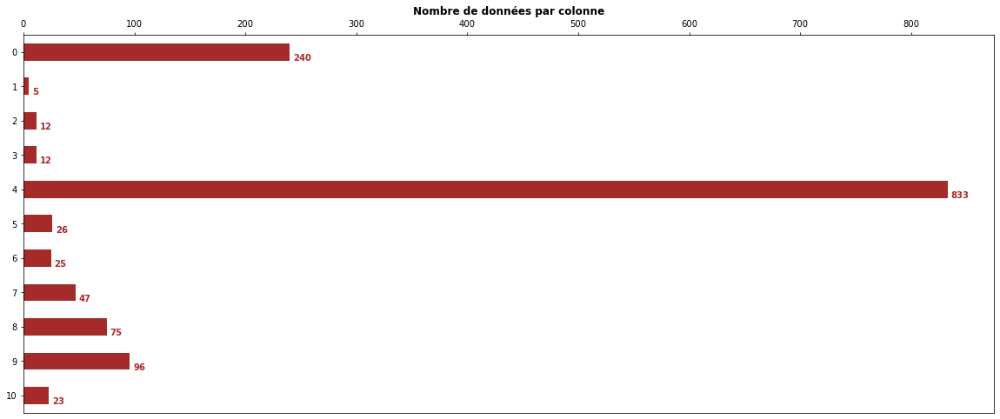

In [28]:
val_texte = dftxt_label.texte
fig, ax = plt.subplots(figsize=(20,8))
val_texte.plot.barh(ax=ax, color='brown')
plt.gca().invert_yaxis()
ax.set_title("Nombre de données par colonne", fontweight='bold')
ax.xaxis.tick_top()
for i, v in enumerate(val_texte):
    ax.text(v + 3, i + .25, str(v), color='brown', fontweight='bold')

In [29]:
df_title_label = data.filter(items = ['label', 'title'])
dftit_label = df_title_label.groupby('label'). agg({'title':'count'})
dftit_label

,title
label,
CP101,240
CP103,5
cp102,12
cp104,12
pvcp201,833
pvcp202,26
pvcp203,25
pvcp204,47
pvcp301,75


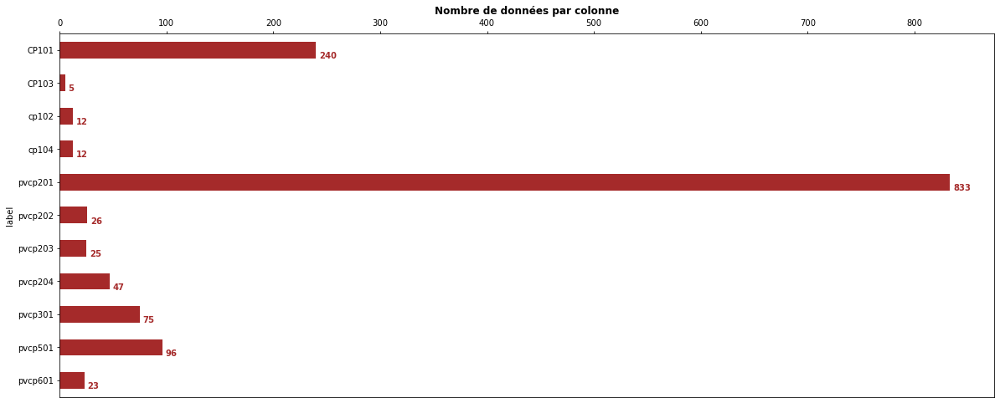

In [30]:
val_texte = dftit_label.title
fig, ax = plt.subplots(figsize=(20,8))
val_texte.plot.barh(ax=ax, color='brown')
plt.gca().invert_yaxis()
ax.set_title("Nombre de données par colonne", fontweight='bold')
ax.xaxis.tick_top()
for i, v in enumerate(val_texte):
    ax.text(v + 3, i + .25, str(v), color='brown', fontweight='bold')

### <span class="bg-success">2_4 Récapitulatif sur l'analyse du jeu de données</span>

__Identification de la target__ : "label" 
'CP101', 'CP103', 'cp102', 'cp104', 
'pvcp201', 'pvcp202','pvcp203', 'pvcp204', 'pvcp301', 'pvcp501', 'pvcp601'

__Nombre de lignes et de colonnes__ : 1394 lignes, 4 colonnes

__Types de variables__ : 4 variables qualitatives 

__Identification des valeurs manquantes__ : Aucune valeur manquante.

__<span class="text-danger">
A noter  : 1 classe est très représentée par rapport aux 10 autres, certaines classes sont sous-représentées.</span>__

**Bilan de l'analyse exploratoire** :
***
- Notre mission est d'automatiser la classification de documents ajoutés par le client à partir des descriptions textuelles des documents et du titre des documents mis à disposition dans le jeu de données.
- Les variables utiles, conservées, contenant des données textuelles ou des images, sont :
    - [x] **texte**,
    - [x] **title**,
    - [x] **labels**

## <span class="bg-info">3. Nettoyage du jeu de données</span>

In [31]:
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from sklearn.cluster import KMeans

#Text preprocessing
import nltk
from string import punctuation
from nltk.corpus import stopwords # About 150 stopwords
from stop_words import get_stop_words # About 900 stopwords
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from nltk import word_tokenize
import texthero as hero
import w2v_preprocess

import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

from sklearn.pipeline import Pipeline 
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from scipy import stats
from sklearn.cluster import KMeans

pd.options.display.precision = 4
pd.options.display.max_columns = 9
pd.options.mode.chained_assignment = None  # default='warn'
import warnings
warnings.filterwarnings('ignore')

import time
import helpers
import re

### <span class="bg-success"> 3.1 Sélection de variables<span>   

In [32]:
# Constitution du dataframe de travail
df_work = data[["title", "texte", "label"]]
df_work

,title,texte,label
0,2004-CP101-#SY2004.1-#D201700-CONVOC AGO-Convocation AG 20-09-17.pdf,"\n\n \n\n7 ADRESSE IMMEUBLE -\n\nAFUT, MURAT\n\n4-22 PLACE DES MAITRES VIGNERONS\n92506 RUEIL MALMATSON\n\nMANDAT MEMBRE AFUL\n\nOGIF\n18 BIS RUE DE VILLIERS\n\n \n\n92594 LEVALLOIS-PERRET\n\n \n\n \n\n \n\n \n\nPOUVOIR\n\nJe soussigné{a)\n\nagissant en qualité de copropriétaire de l'immeuble précité constitue pour\nmandataire\n\nou à son défaut :\n\npour me représenter à l'assemblée générale : AFUL MURAT\n\npour le 20 SEPTEMBRE 2017\n\n| En conséquence, assister à l'assemblée, signer ies feuilles de\nprésence et toutes autres Pièces, prendre part À toutes les délibérations, émettre\n\ntous votes, sur les questions mentionnées à l'ordre du jour et généralement faire\nle nécessaire.\n\nIL est rappelé que le syndic ne peut pas représenter un copropriétaire et que\nchacun des copropriétaires ne peut recevoir que trois pouvoirs, Il peut recevoir\n\nplus de trois pouvoirs si 1e total des voix dont il dispose n'excède pas 5 % des\nvoix du syndicat.\n\nLe\nFaire précéder la signature de\...",CP101
1,1517-CP101-#SY1517.1-#D201900-CONVOC_AGO_20190624.pdf,"RECOMMANDEE AR. | de IMMEUBLE\n\n> Convocation à l’Assemblée générale ordinaire\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se\n\ntiendra le :\nLundi 24 Juin 2019à 18 H 00\n\nFONCIA SEINE OUEST\n10 RUE MAURICE BOKANOSWKI\n92600 ASNIERES-SUR-SEINE\n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. A défaut\nde majorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais\nsupplémentaires supportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Assemblée Générale, il vous est possible de vous y faire représenter\nà l'aide du pouvoir joint. Nous vous rappelons à ce sujet que le syndic ou son représentant ne peut\nrecevoir de pouvoir à son nom, en blanc et en faire utilisation, qu'un mandataire peut recevoir plus de\ntrois pouvoirs si le total des voix ...",CP101
2,2030-CP101-#SY2030.1-#D201800-CONVOC AGO-Convoc AG 140518.pdf,"\n\nRECOMMANDEE AR. IMMEUBLE\nLES DOMES RST\n\n2-4 RUE DES HAUTS DE CHANTURGUE\n30 RUE DU TORPILLEUR SIROCCO\n63100 CLERMONT-FERRAND\n\n> Convocation à l’Assemblée générale Annuelle <\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se tiendra\n\nle :\nLundi 14 Mai 2018 à 18 H 00\n\nSite LECLANCHE (salle 1)\nRue de Champratel\n63100 CLERMONT FERRAND\n\n \n\nREC""\n13 AVR, 2018\n\na |\n\n \n \n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nLes 7-16-17-21 résolutions nécessitent la majorité de l'article 25-1 de la loi.\nLes10-11-12-13 résolutions nécessitent la majorité de l'article 25 de la loi.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. À défaut de\nmajorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais supplémentaires\nsupportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Asse...",CP101
3,6352-CP101-#D201500-CONVOC AGO-4042.1-6352.1-Convocation AG RESIDENCE 3.04.15.pdf,"\n\n \n\n \n\nREGU\n\n \n\n \n \n\nTRAVAILLER EN TOUTE T\n\nle\n\n14 MARS 2015\nRÉQ sausnzs\n\nep ses NE\n\nTE\n\nRANSPARENCE, GEST ES\n\nSENTIEL,\n\nCompte-rendu de gestion annuel\n\n03 Mars 2015\n\nImmeuble\n\nRESIDENCE LES SABLONS-NOTRE DA\n1 À 20 RUE DES SABLONS 18 À 36 RUE DE LA\nBERTHIE 95870 BEZONS\n\n \n\nff 7] WA FONCIA cos\n\nConseil syndical\nM. BESTANT\n\nM. BITAR\n\nM BRANCO CALADO\n\nM DROUET/LATTE\n\n© MEL HARNANE\n\nM FRANCOÏS/ELIENT\nM LEGRAND\n\nM REDDAF\n\nHE\n\nL' iMinabliler clair, net 3 pr écis\n\nVos interlocuteurs FONCIA\n\nJean-Michel PIMONT\nDirecteur d'agence\n\nTél. 01.39.68.76.81.\njean-michel.pimont@foncia.fr\n\nRosa MARTINS\n\nAssistante copropri

In [33]:
df_work = df_work.astype(np.str)

In [34]:
# Dataframe témoin des modifications
df_temoin = pd.DataFrame({})
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Texte original',
                                  df_work['texte'][1])

### <span class="bg-success"> 3.2 Nettoyage / Normalisation <span>  
__Nettoyage__ :   
- passage en minuscule 
- tokenisation
- retrait des stop words    
- suppression des chiffres
- ponctuation
    
Pemière phase de définition de l'objet de l'analyse : 
- la tokenisation des textes qui consiste à identifier les unités de textes élémentaires (tokens) qui peuvent être des mots, mais aussi des lettres, des syllabes, des phrases, ou des séquences de ces éléments.
- Si les mots sont des unités de sens évidentes, les paires, les triplets de mots le sont aussi (n-grammes).
- à partir de ces tokens, l'analyse de la fréquence des mots peut être effectuée pour construire un dictionnaire permettant de filtrer les tokens selon leurs fréquences.
- les tokens les plus fréquents qui n'apportent donc aucune information sont supprimés.
- les tokens très peu fréquents qui apportent une information singulière sont également supprimés.

__Groupement sémantique__ :
- stemming (racinisation)
-lemmatisation

### <span style='background:Thistle'>3.2.1 Pré-traitement "texte" pas à pas</span>

Préparation des données, les rendant exploitables pour l'automatisation des catégorisation.
Pré-traitement pas à pas pour observer le résultat de chaque étape pour les transformations effectuées sur les variables 'texte' et 'title'.

#### <span style='background:Moccasin'>Tokenisation</span>

Pemière phase de définition de l'objet de l'analyse : 
- la tokenisation des textes qui consiste à identifier les unités de textes élémentaires (tokens) qui peuvent être des mots, mais aussi des lettres, des syllabes, des phrases, ou des séquences de ces éléments.
- Si les mots sont des unités de sens évidentes, les paires, les triplets de mots le sont aussi (n-grammes).
- à partir de ces tokens, l'analyse de la fréquence des mots peut être effectuée pour construire un dictionnaire permettant de filtrer les tokens selon leurs fréquences.
- les tokens les plus fréquents qui n'apportent donc aucune information sont supprimés.
- les tokens très peu fréquents qui apportent une information singulière sont également supprimés.

In [35]:
# Tokenisation
# ----------------------------------------------------------------------
# Décomposition en tokens (souvent un mot mais peut être 3) par exemple)
df_work['texte_clean'] = [word_tokenize(row)
                                  for row in df_work['texte']]
# Suivi des modifications
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Tokenisation',
                                  df_work['texte_clean'][1])

In [36]:
# Nombre de tokens total dans toutes les descriptions
list_all_token = []
for row in df_work['texte_clean']:
    list_all_token.extend(row)
nb_tok = len(list_all_token)
nb_tok_unique = len(set(list_all_token))
display(f'Nombre de tokens total dans les descriptions : {nb_tok}')
display(f'Nombre de tokens uniques dans les descriptions : {nb_tok_unique}')

'Nombre de tokens total dans les descriptions : 7150769'

'Nombre de tokens uniques dans les descriptions : 243319'

In [37]:
# Transformer liste en string
df_work['texte_clean'] = \
    df_work['texte_clean'].apply(lambda x: ' '.join(x))
# Suivi des modifications
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Tokens en 1 phrase',
                                  df_work['texte_clean'][1])

#### <span style='background:Moccasin'>Normalisation</span>

Deuxième phase de lissage, correction et nettoyage des données textuelles :
- Mettre le texte en minuscule, mais au risque de perdre les capitales initiales qui indicent les noms communs,  
- supprimer la ponctuation, mais du même coup peut déstructurer les phrases, 
- éliminer les nombres et dates, 
- repérer (et éliminer) les liens URL et les mentions de personnes
- éliminer aussi les mots sans signification que l’anglais dénomme par “stopwords” avec des dictionnaires, 
- repérer et traiter les émoticônes...

**Librairie TextHero**

Les fonctions de nettoyage de TEXTHERO utilisée seront les suivantes :

- [x] **lowercase(s)** Tout le texte en minuscules.
- [x] **remove_digits()** Supprimer tous les blocs de chiffres.
- [x] **remove_punctuation()** Supprimer tous les string.punctuation (! "# $% & '() * +, -. / :; <=>? @ [\] ^ _` {|} ~).
- [x] **remove_stopwords()** Supprimer tous les mots vides (ATTENTION : anglais uniquement).
- [x] **remove_whitespace()** Supprimer tout espace blanc entre les mots.

*Note* :
****
- [Source](https://ichi.pro/fr/essayez-texthero-le-moyen-le-plus-simple-et-le-plus-simple-de-nettoyer-et-d-analyser-du-texte-dans-pandas-120638900617842)
- [Doc_API_Reference](https://pypi.org/project/texthero/)

- [x] **lowercase(s)** Tout le texte en minuscules.

In [38]:
# Passage en minuscules pour être insensible à la casse (stopwords en
# minuscules)
df_work['texte_clean'] = hero.lowercase(df_work['texte_clean'])
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Hero minuscules',
                                  df_work['texte_clean'][1])

- [x] **remove_digits()** Supprimer tous les blocs de chiffres.

In [39]:
# Supprimer tous les chiffres.
df_work['texte_clean'] = \
    hero.remove_digits(df_work['texte_clean'],
                       only_blocks=False)
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Hero suppr chiffres',
                                  df_work['texte_clean'][1])

- [x] **remove_punctuation()** Supprimer tous les string.punctuation (! "# $% & '() * +, -. / :; <=>? @ [\] ^ _` {|} ~).

In [40]:
# Supprime la ponctuation
df_work['texte_clean'] = \
    hero.remove_punctuation(df_work['texte_clean'])
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Hero suppr ponctuation',
                                  df_work['texte_clean'][1])

- [x] **remove_whitespace()** Supprimer tout espace blanc entre les mots (\r\n...).

In [41]:
# Supprime les espaces blancs, retour chariot...
df_work['texte_clean'] = \
    hero.remove_whitespace(df_work['texte_clean'])
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Hero suppr espaces blancs',
                                  df_work['texte_clean'][1])

In [42]:
# Stop_words par défaut de la librairie TextHero (179 mots)
default_stopwords = hero.stopwords.DEFAULT
# Ajout des stops words de la librairie NLTK (174 mots)
custom_stopwords = default_stopwords.union(get_stop_words('french'))
# Ajout des stops words de la librairie stopwords (179 mots)
custom_stopwords = custom_stopwords.union(stopwords.words('french'))
# Supprimer les stop_words français définis dans les 3 librairies
df_work['texte_clean'] = \
    hero.remove_stopwords(df_work['texte_clean'],
                          custom_stopwords)
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Hero stop_words',
                                  df_work['texte_clean'][1])

**Mots trop fréquents ou trop rares**

In [43]:
# Fréquence de tous les mots de tous les produits dans la description?
texte = ''
sentence = ' '.join([texte + row for row in df_work['texte_clean']])
tokens = nltk.word_tokenize(sentence)
fdist = FreqDist(tokens)
# Constitution du dataframe de travail
df_frequence_mot = pd.DataFrame({'Mot': fdist.keys(),
                                 'Frequence': fdist.values()}) \
                    .sort_values(['Frequence'], ascending=False)
nb_tot = df_frequence_mot['Frequence'].count()
df_frequence_mot['%_frequence'] = \
    round((df_frequence_mot['Frequence'])*100/nb_tot, 2)

In [44]:
# Mots très fréquents?
df_frequence_mot[df_frequence_mot['%_frequence'] > 5]

,Mot,Frequence,%_frequence
28,assemblée,43197,40.66
361,tantièmes,37348,35.15
29,générale,36556,34.41
54,copropriétaires,35945,33.83
139,article,34371,32.35
229,mme,34340,32.32
52,syndic,27690,26.06
109,travaux,27405,25.79
199,résolution,26032,24.50
407,majorité,24661,23.21


- On ajoutera à la liste des mots à supprimer les 7 premiers mots les plus fréquents qui sont assez généralistes et n'apportent aucune information

In [45]:
# Mots très rares?
df_frequence_mot[df_frequence_mot['Frequence'] < 3]

,Mot,Frequence,%_frequence
54140,requalifiquation,2,0.0
81344,labed,2,0.0
72676,sarant,2,0.0
41760,mouchoir,2,0.0
85212,snassuopy,2,0.0
...,...,...,...
50087,mmobéher,1,0.0
50088,orpen,1,0.0
50089,hrd,1,0.0
50090,dioù,1,0.0


- On ajoutera à la liste des mots à supprimer les mots les plus rares qui sont trop singuliers pour apporter une information.

In [46]:
# Ajout des mots très fréquents
custom_words_manuel = set(df_frequence_mot['Mot'].head(7).to_list())
# Ajout des mots rares
custom_words_manuel = \
    custom_words_manuel.union(df_frequence_mot[df_frequence_mot['Frequence']
                                               < 3]['Mot'].to_list())
# Supprimer les stop_words anglais définis dans les 3 librairies
df_work['texte_clean'] = \
    hero.remove_stopwords(df_work['texte_clean'],
                          custom_words_manuel)
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Suppr mots fréquents-rares',
                                  df_work['texte_clean'][1])

In [47]:
df_temoin

,Action,Contenu
0,Texte original,"1 RECOMMANDEE AR. | de IMMEUBLE\n\n> Convocation à l’Assemblée générale ordinaire\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se\n\ntiendra le :\nLundi 24 Juin 2019à 18 H 00\n\nFONCIA SEINE OUEST\n10 RUE MAURICE BOKANOSWKI\n92600 ASNIERES-SUR-SEINE\n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. A défaut\nde majorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais\nsupplémentaires supportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Assemblée Générale, il vous est possible de vous y faire représenter\nà l'aide du pouvoir joint. Nous vous rappelons à ce sujet que le syndic ou son représentant ne peut\nrecevoir de pouvoir à son nom, en blanc et en faire utilisation, qu'un mandataire peut recevoir plus de\ntrois pouvoirs si le total des ..."
1,Tokenisation,"1 [RECOMMANDEE, AR, ., |, de, IMMEUBLE, >, Convocation, à, l, ’, Assemblée, générale, ordinaire, Madame, ,, Mademoiselle, ,, Monsieur, ,, Nous, vous, remercions, de, bien, vouloir, participer, à, l'Assemblée, Générale, des, Copropriétaires, qui, se, tiendra, le, :, Lundi, 24, Juin, 2019à, 18, H, 00, FONCIA, SEINE, OUEST, 10, RUE, MAURICE, BOKANOSWKI, 92600, ASNIERES-SUR-SEINE, à, l'effet, de, délibérer, sur, l'ordre, du, jour, joint, ., En, conséquence, ,, il, est, important, que, tous, les, copropriétaires, soient, présents, ou, représentés, ., A, défaut, de, majorité, ,, une, nouvelle, Assemblée, Générale, pourrait, être, tenue, ,, mais, génératrice, de, frais, supplémentaires, supportés, par, tous, les, ...] 1 [CADOT, BEAUPLET, SAFAR, Lettre, recommandée, A.R..."
2,Tokens en 1 phrase,"1 RECOMMANDEE AR . | de IMMEUBLE > Convocation à l ’ Assemblée générale ordinaire Madame , Mademoiselle , Monsieur , Nous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se tiendra le : Lundi 24 Juin 2019à 18 H 00 FONCIA SEINE OUEST 10 RUE MAURICE BOKANOSWKI 92600 ASNIERES-SUR-SEINE à l'effet de délibérer sur l'ordre du jour joint . En conséquence , il est important que tous les copropriétaires soient présents ou représentés . A défaut de majorité , une nouvelle Assemblée Générale pourrait être tenue , mais génératrice de frais supplémentaires supportés par tous les copropriétaires . Si vous ne pouviez être présent à l'Assemblée Générale , il vous est possible de vous y faire représenter à l'aide du pouvoir joint . Nous vous rappelons à ce sujet que le syndic ou son représentant ne peut recevoir de pouvoir à son nom , en blanc et en faire utilisation , qu'un mandataire peut recevoir plus de trois pouvoirs si le total des voix dont il dis..."
3,Hero minuscules,"1 recommandee ar . | de immeuble > convocation à l ’ assemblée générale ordinaire madame , mademoiselle , monsieur , nous vous remercions de bien vouloir participer à l'assemblée générale des copropriétaires qui se tiendra le : lundi 24 juin 2019à 18 h 00 foncia seine ouest 10 rue maurice bokanoswki 92600 asnieres-sur-seine à l'effet de délibérer sur l'ordre du jour joint . en conséquence , il est important que tous les copropriétaires soient présents ou représentés . a défaut de majorité , une nouvelle assemblée générale pourrait être tenue , mais génératrice de frais supplémentaires supportés par tous les copropriétaires . si vous ne pouviez être présent à l'assemblée générale , il vous est possible de vous y faire représenter à l'aide du pouvoir joint . nous vous rappelons à ce sujet que le syndic ou son représentant ne peut recevoir de pouvoir à son nom , en blanc et en faire utilisation , qu'un mandataire peut recevoir plus de trois pouvoirs si le total des voix dont il dis..."
4,Hero suppr chiffres,"1 recommandee ar . | de immeuble > convocation à l ’ assemblée générale ordinaire madame , mademoiselle , monsieur 

**Wordclouds**

Visualisation des mots les plus fréquents pour chacune des 7 catégories après le pré-traitement de la variable 'description'.

Mots les plus fréquents de la catégorie : CP101


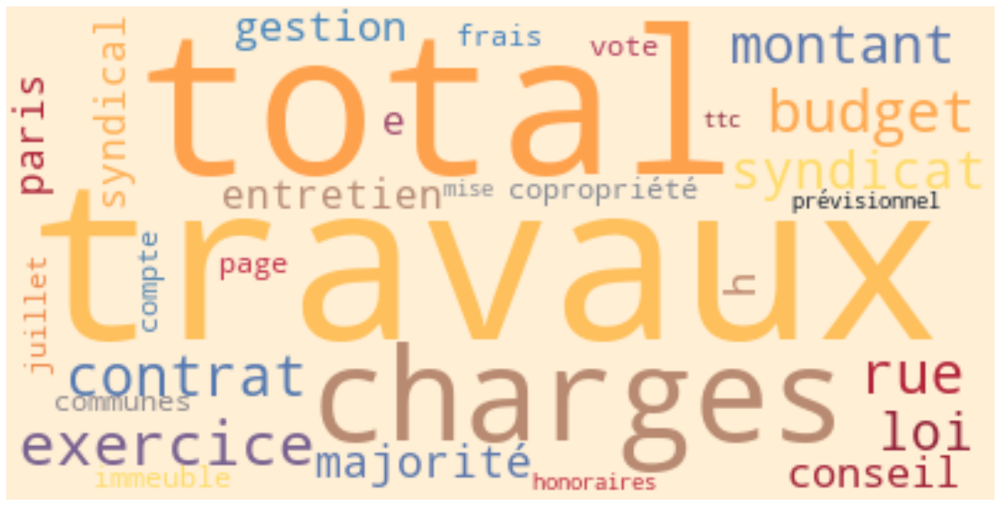

Mots les plus fréquents de la catégorie : CP103


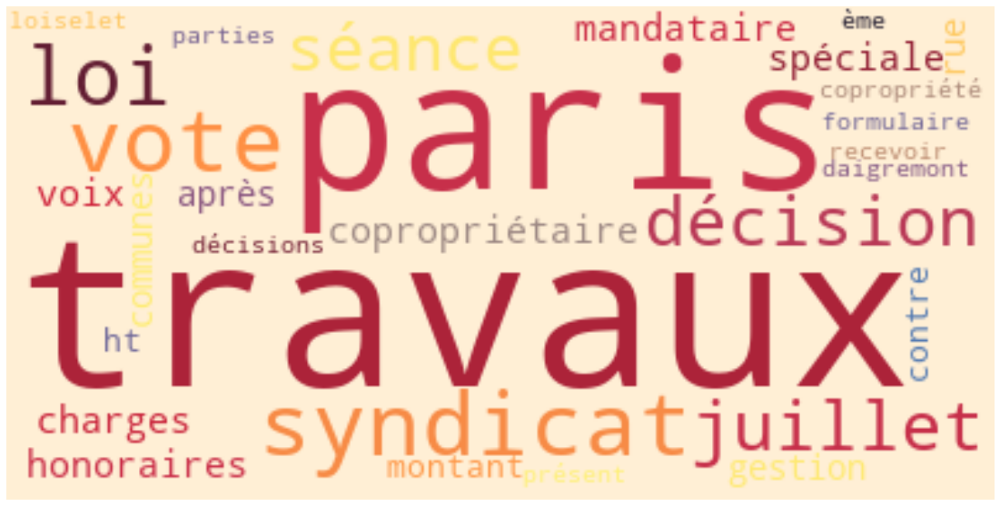

Mots les plus fréquents de la catégorie : cp102


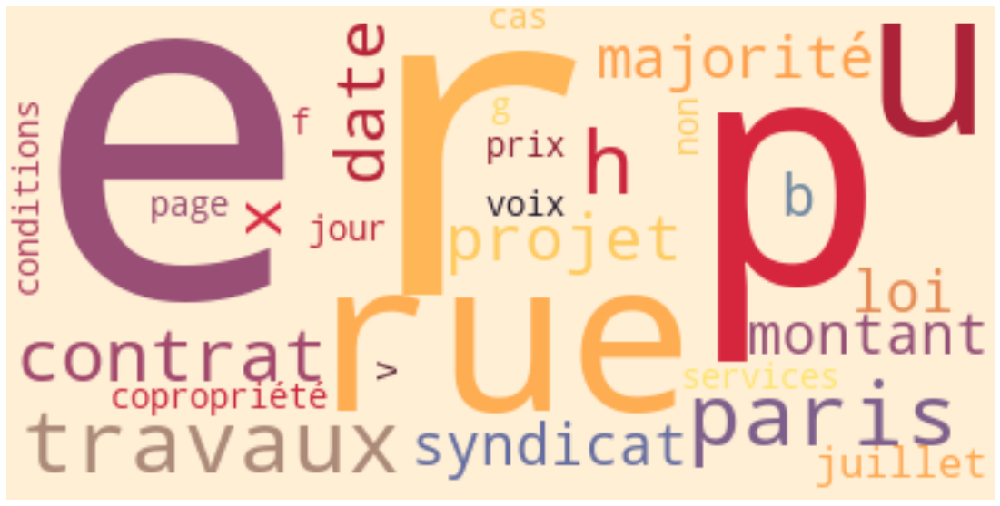

Mots les plus fréquents de la catégorie : cp104


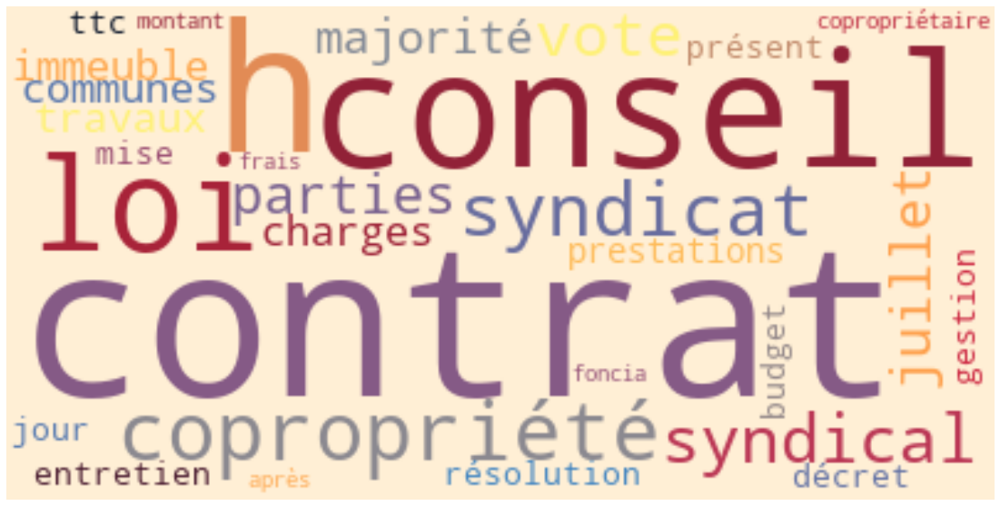

Mots les plus fréquents de la catégorie : pvcp201


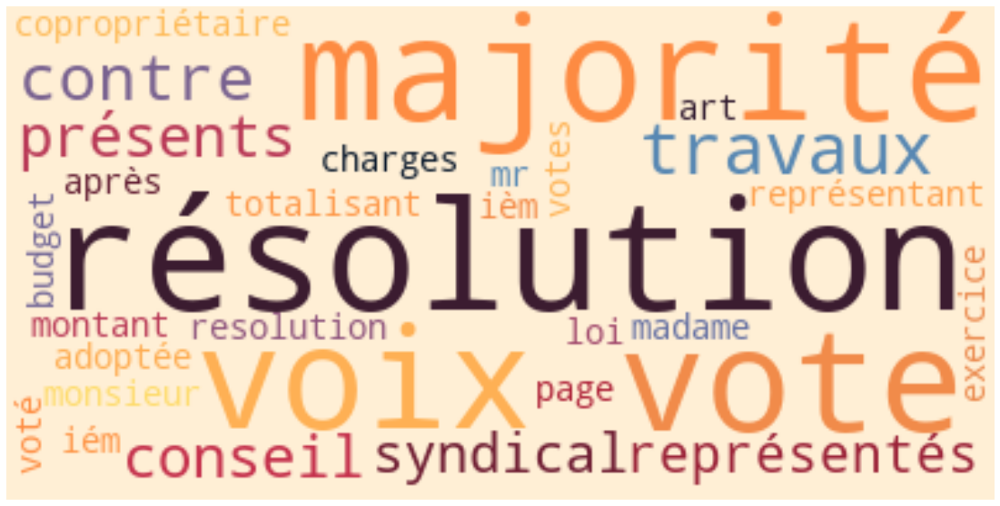

Mots les plus fréquents de la catégorie : pvcp202


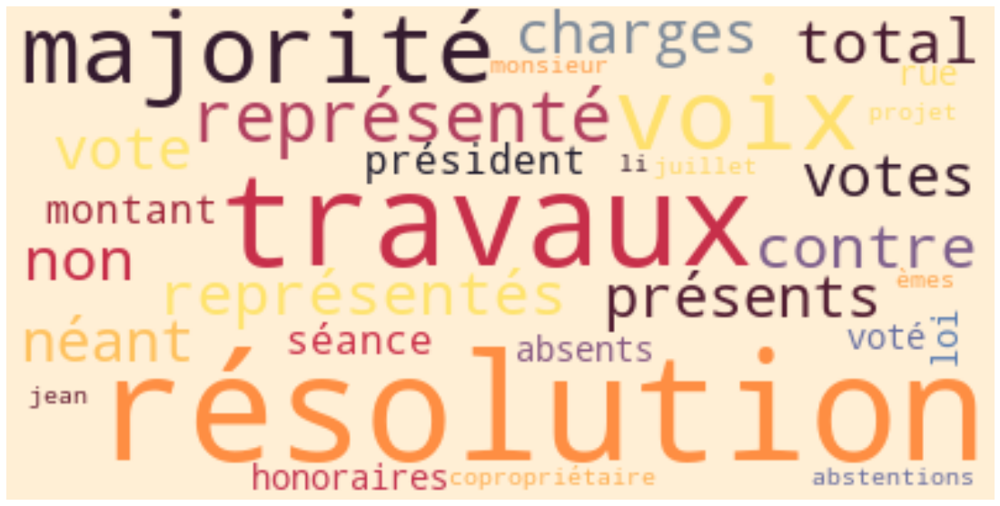

Mots les plus fréquents de la catégorie : pvcp203


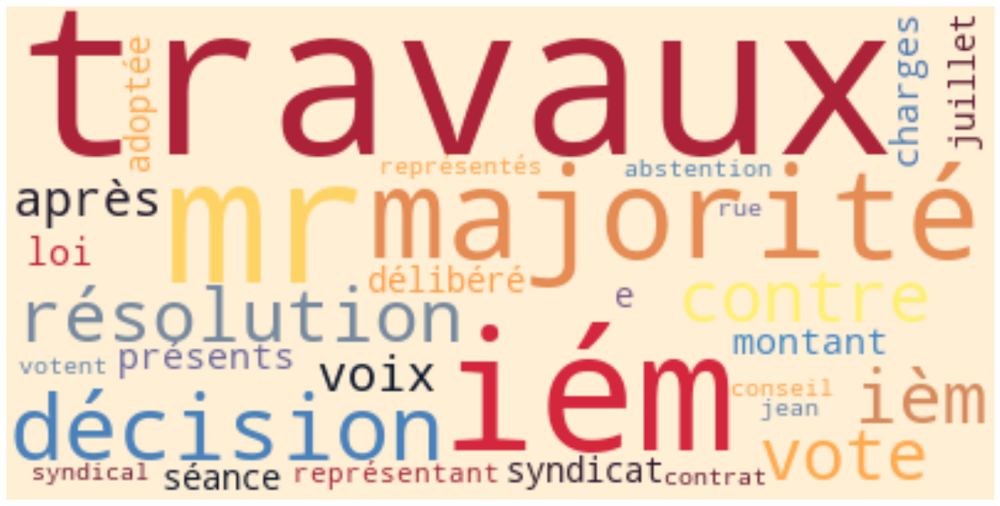

Mots les plus fréquents de la catégorie : pvcp204


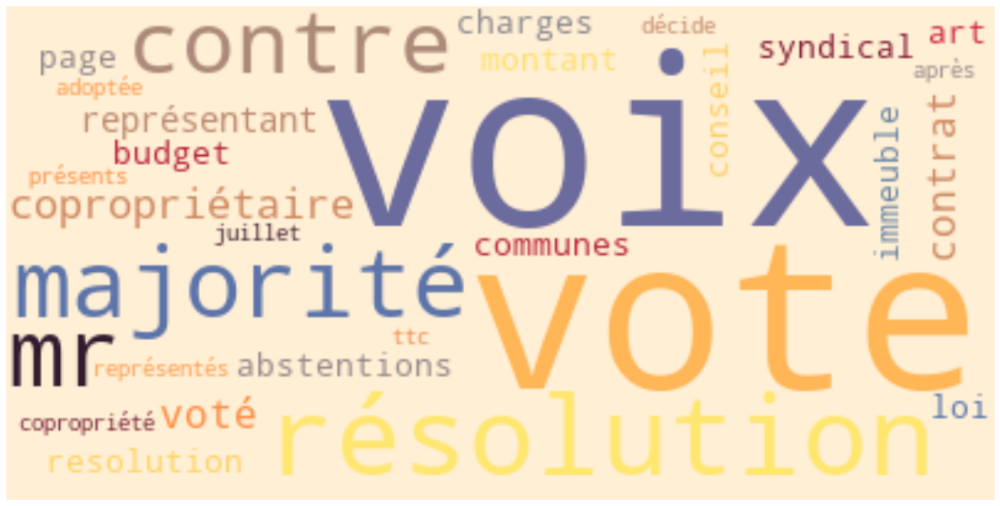

Mots les plus fréquents de la catégorie : pvcp301


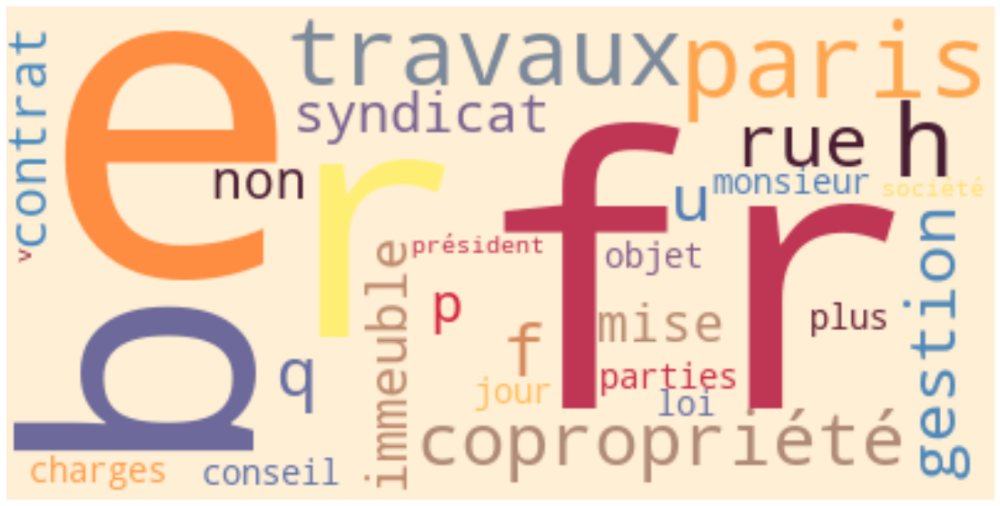

Mots les plus fréquents de la catégorie : pvcp501


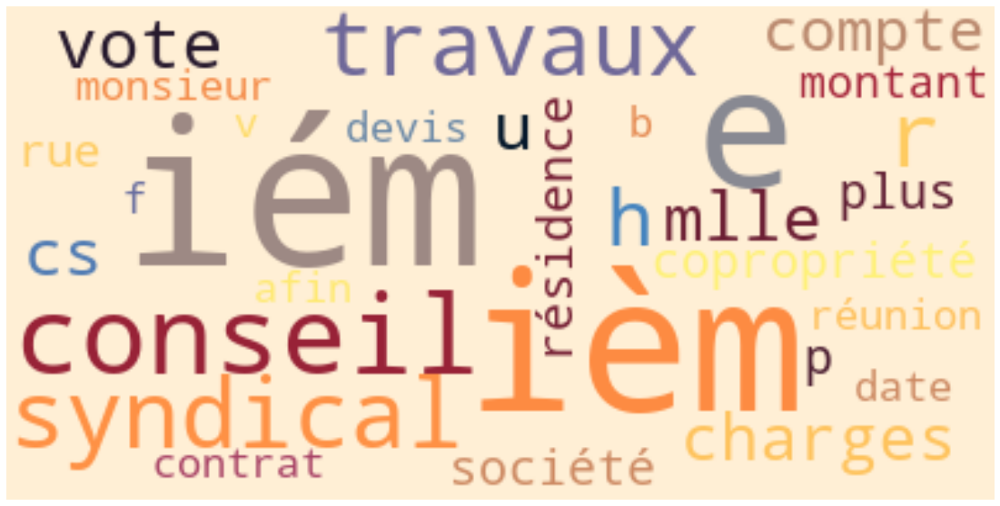

Mots les plus fréquents de la catégorie : pvcp601


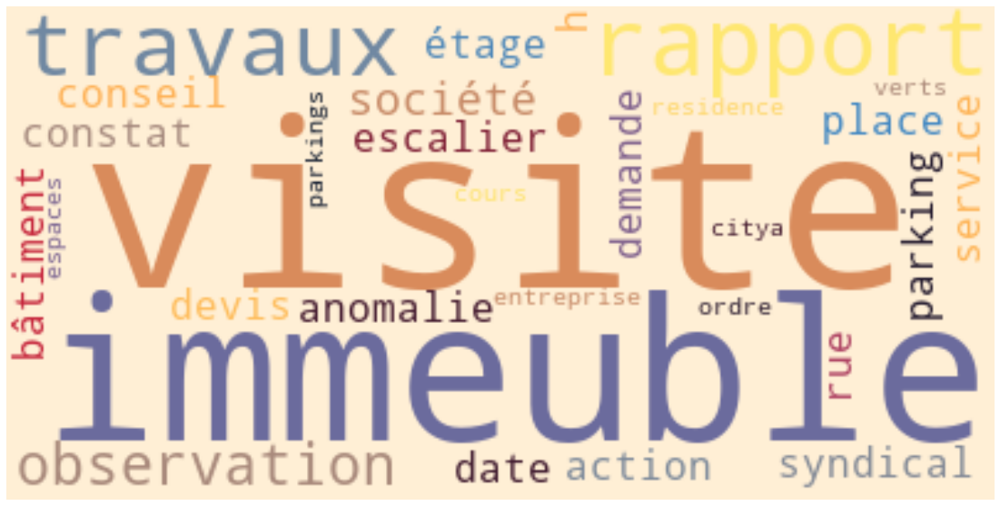

In [48]:
outils_visu.affiche_wordcloud_hue(df_work, 'texte_clean',
                                  'label', 30)

**Fréquence des 50 mots les plus fréquents dans le texte des documents**

In [49]:
# Préparation du dataframe de travail
# ---------------------------------------------------------------------
# Fréquence de tous les mots de tous les documents dans le texte
# nettoyé ?
texte = ''
sentence = ' '.join([texte + row for row in df_work['texte_clean']])
tokens = nltk.word_tokenize(sentence)
fdist = FreqDist(tokens)
# Constitution du dataframe de travail
df_freq_clean = pd.DataFrame({'Mot': fdist.keys(),
                              'Frequence': fdist.values()}) \
                .sort_values(['Frequence'], ascending=False)
nb_tot = df_freq_clean['Frequence'].count()
df_freq_clean['%_frequence'] = \
    round((df_freq_clean['Frequence'])*100/nb_tot, 2)

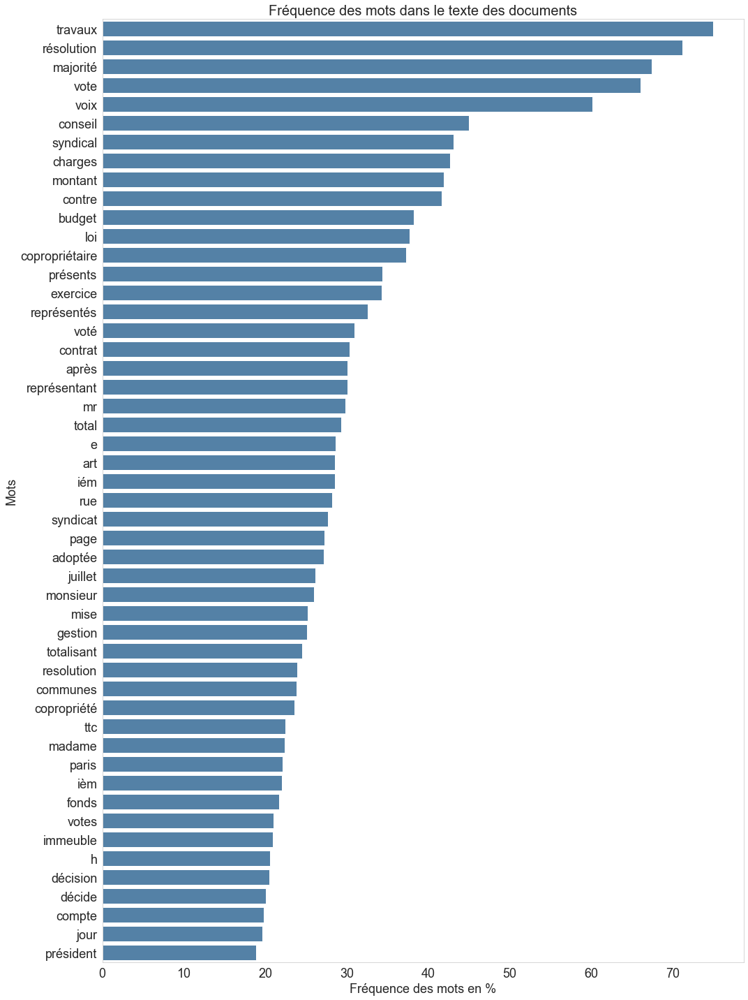

In [50]:
# Visualisation des 50 mots les plus fréquents dans texte
# ---------------------------------------------------------------------
# Barplot de répartition
data_visu = df_freq_clean.head(50)
# Préparation de la liste des 50 mots les plus fréquents
liste_50_mots_desc = data_visu['Mot'].to_list()
sns.set_style("whitegrid")
plt.figure(figsize=(15, 20))
sns.barplot(x=data_visu['%_frequence'],
            y=data_visu['Mot'],
            data=data_visu,
            color='SteelBlue')
plt.title('Fréquence des mots dans le texte des documents',
          fontsize=20)
plt.xlabel('Fréquence des mots en %', fontsize=18)
plt.ylabel('Mots', fontsize=18)
plt.xticks(fontsize=18)
plt.yticks(fontsize=18)
plt.grid(False)
plt.tight_layout()
plt.show()

**Fréquence des 50 mots les plus fréquents dans la description par catégorie**

In [51]:
# Préparation du dataframe de visualisation
# --------------------------------------------------------------------
df_freq_cat = pd.DataFrame({})
liste_categories = df_work['label'].unique().tolist()
for cat in liste_categories :
    df1_work=df_work[df_work['label'] == cat]
    texte = ''
    sentence = ' '.join([texte + row for row \
                         in df1_work['texte_clean']])
    tokens = nltk.word_tokenize(sentence)
    fdist = FreqDist(tokens)
    df_freq_cat = df_freq_cat.append(pd.DataFrame({
            'Mot': fdist.keys(),
            'Frequence': fdist.values(),
            'Catégorie': cat
        }), ignore_index=True)

In [52]:
data_cat = df_freq_cat[df_freq_cat['Mot'].isin(liste_50_mots_desc)] \
    .sort_values(by=['Mot','Frequence'], ascending=[True,False])#.head(50)
data_cat

,Mot,Frequence,Catégorie
32224,adoptée,8827,pvcp201
75333,adoptée,520,pvcp204
1119,adoptée,262,CP101
69065,adoptée,155,pvcp203
65274,adoptée,86,pvcp202
95046,adoptée,53,pvcp501
26967,adoptée,29,cp104
84490,adoptée,15,pvcp301
22897,adoptée,1,CP103
25331,adoptée,1,cp102


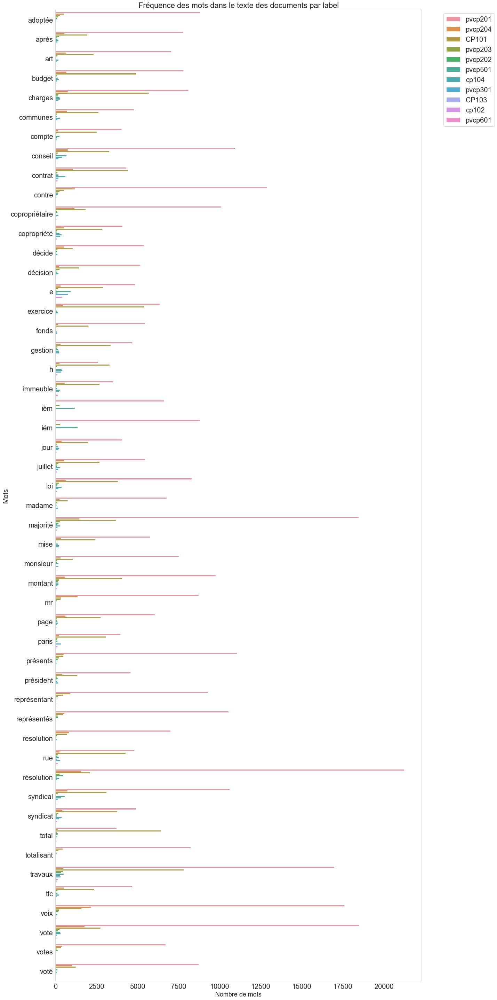

In [53]:
# Visualisation des 50 mots les plus fréquents dans texte
# ---------------------------------------------------------------------
# Barplot de répartition
sns.set_style("whitegrid")
plt.figure(figsize=(20, 40))
sns.barplot(x=data_cat['Frequence'],
            y=data_cat['Mot'],
            hue=data_cat['Catégorie'],
            data=data_cat)
plt.title('Fréquence des mots dans le texte des documents par label',
          fontsize=22)
plt.xlabel('Nombre de mots', fontsize=18)
plt.ylabel('Mots', fontsize=20)
plt.xticks(fontsize=20)
plt.yticks(fontsize=20)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, fontsize=20)
plt.grid(False)
plt.tight_layout()
plt.show()

### <span style='background:PowderBlue'>3.3. Groupement sémantique</span>

#### <span style='background:Moccasin'>Racinisation</span>

- La **racinisation**(ou **stemming** en anglais) consiste à ne conserver que la racine des mots étudiés. 
- L'idée étant de supprimer les suffixes, préfixes et autres des mots afin de ne conserver que leur origine. 
- C'est un procédé plus simple que la lemmatisation et plus rapide à effectuer puisqu'on tronque les mots essentiellement contrairement à la lemmatisation qui nécessite d'utiliser un dictionnaire.

**TextHero**
- texthero.preprocessing.stem utilise deux algorithmes de troncature NLTK connus sous le nom de nltk.stem.SnowballStemmer et nltk.stem.PorterStemmer. - SnowballStemmer doit être utilisé lorsque la série Pandas contient du texte non-anglais et qu'elle dispose d'un support multilangue.
- Comme le texte est en français on choisira 'snowball'.

[Source](https://texthero.org/docs/api/texthero.preprocessing.stem) 

In [54]:
# Racinisation
# ---------------------------------------------------------------------
# Exemple avec la variable description
df_work['texte_clean_stem'] = hero.stem(df_work['texte_clean'],
                                                stem='snowball')
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Racinisation',
                                  df_work['texte_clean_stem'][1])

#### <span style='background:Moccasin'>Lemmatisation</span>

- Le processus de **lemmatisation** consiste à représenter les mots (ou lemmes) sous leur forme canonique pour ne conserver que le sens des mots utilisés dans le corpus.
- Par exemple pour un verbe, ce sera son infinitif, pour un nom, son masculin singulier. 

[Source](https://stackoverflow.com/questions/47557563/lemmatization-of-all-pandas-cells)

In [55]:
# Lemmatisation
# ---------------------------------------------------------------------
w_tokenizer = nltk.tokenize.WhitespaceTokenizer()
lemmatizer = nltk.stem.WordNetLemmatizer()
df_work['texte_clean_lemma'] = \
    [[lemmatizer.lemmatize(w) for w in w_tokenizer.tokenize(text)]
     for text in df_work['texte_clean']]
# Transformer liste en string
df_work['texte_clean_lemma'] = \
    df_work['texte_clean_lemma'].apply(lambda x: ' '.join(x))
# Ajoute dans le dataframe témoin
df_temoin = \
    outils_nlp.suivre_modif_texte(df_temoin, 'Lemmatisation',
                                  df_work['texte_clean_lemma'][1])

### <span style='background:PowderBlue'>3.4 Visualisation des différentes transformations</span>

In [56]:
df_temoin.style.hide_index()

### <span style='background:PowderBlue'>3.5. Pré-traitement "title"</span>

In [57]:
# Pré-traitement tokenisation, normalisation, stopwords
outils_nlp.pretraiter_texte(df_work, 'title',
                            'title_clean', [])
# Racinisation
outils_nlp.raciniser_texte(df_work, 'title_clean',
                           'title_stem')
# Lemmatisation
outils_nlp.lemmatiser_texte(df_work, 'title_clean',
                            'title_lemma')

In [58]:
df_work[['title_clean', 'title_stem',
           'title_lemma']].head(5)

,title_clean,title_stem,title_lemma
0,cp sy convoc ago convocation ag pdf,cp sy convoc ago convoc ag pdf,cp sy convoc ago convocation ag pdf
1,cp sy convoc ago pdf,cp sy convoc ago pdf,cp sy convoc ago pdf
2,cp sy convoc ago convoc ag pdf,cp sy convoc ago convoc ag pdf,cp sy convoc ago convoc ag pdf
3,cp convoc ago convocation ag residence pdf,cp convoc ago convoc ag resid pdf,cp convoc ago convocation ag residence pdf
4,cp sy convoc ago sdc pdf,cp sy convoc ago sdc pdf,cp sy convoc ago sdc pdf


In [59]:
# Fréquence de tous les mots de tous les documents dans le titre?
texte_1 = ''
sentence_1 = ' '.join([texte_1 + row for row in
                       df_work['title_clean']])
tokens_1 = nltk.word_tokenize(sentence_1)
fdist_1 = FreqDist(tokens_1)
# Constitution du dataframe de travail
df_frequence_mot_1 = pd.DataFrame({'Mot': fdist_1.keys(),
                                   'Frequence': fdist_1.values()}) \
                     .sort_values(['Frequence'], ascending=False)
nb_tot_1 = df_frequence_mot_1['Frequence'].count()

In [60]:
# Mots très fréquents?
df_frequence_mot_1[df_frequence_mot_1['Frequence'] > 1000]

,Mot,Frequence
6,pdf,1395
0,cp,1394
1,sy,1237
74,pv,1230
3,ago,1095


In [61]:
# Mots très rares?
df_frequence_mot_1[df_frequence_mot_1['Frequence'] < 2]

,Mot,Frequence
288,point,1
313,gaz,1
311,ramonage,1
312,conduits,1
280,non,1
300,repartitions,1
309,vidéosurveillance,1
299,bases,1
298,explications,1
297,transfert,1


**Wordclouds**

Mots les plus fréquents de la catégorie : CP101


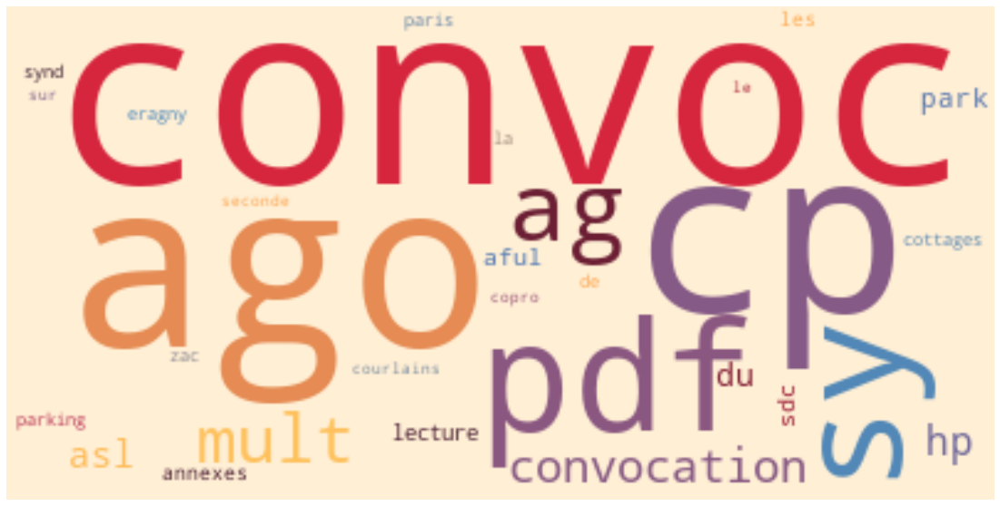

Mots les plus fréquents de la catégorie : CP103


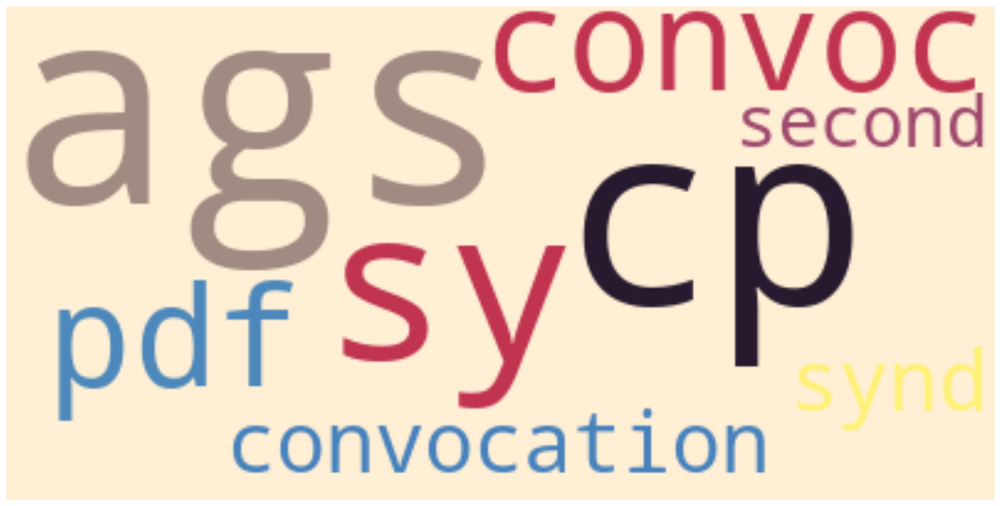

Mots les plus fréquents de la catégorie : cp102


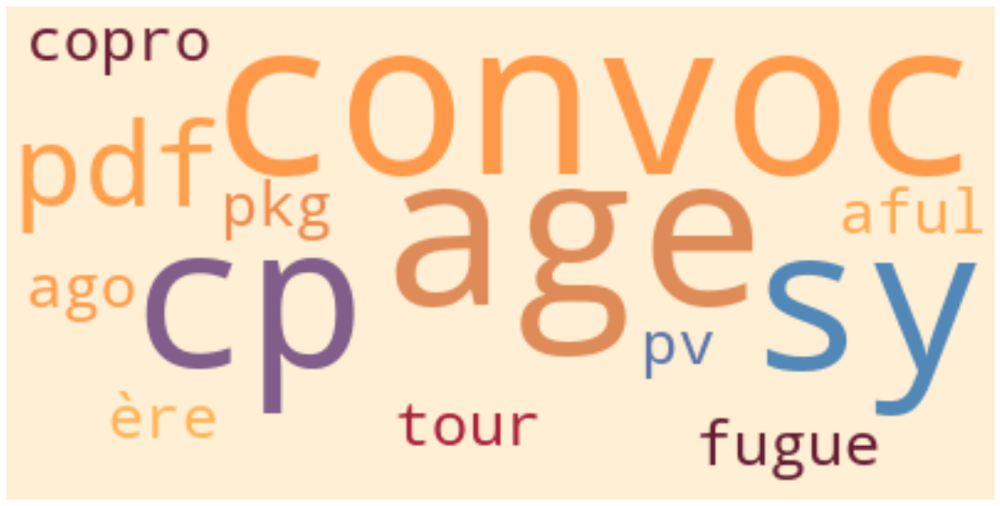

Mots les plus fréquents de la catégorie : cp104


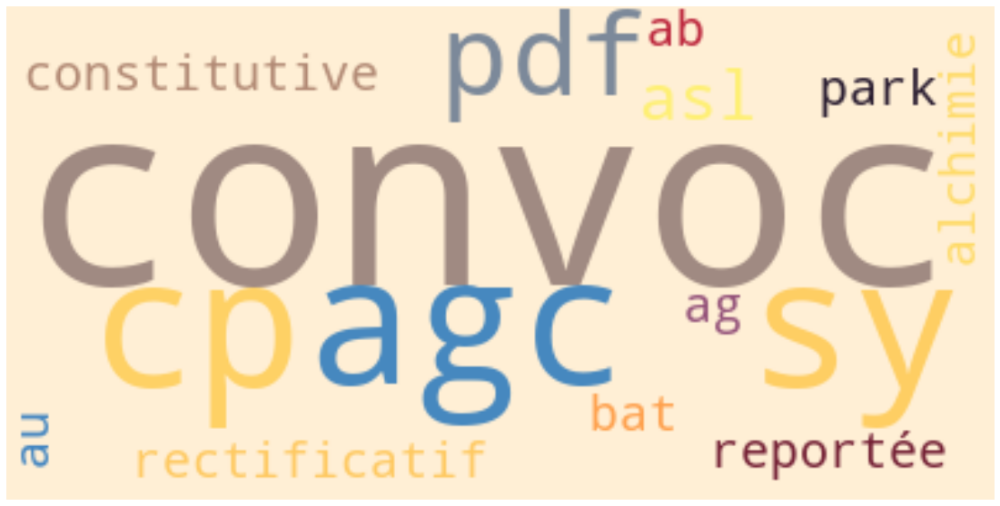

Mots les plus fréquents de la catégorie : pvcp201


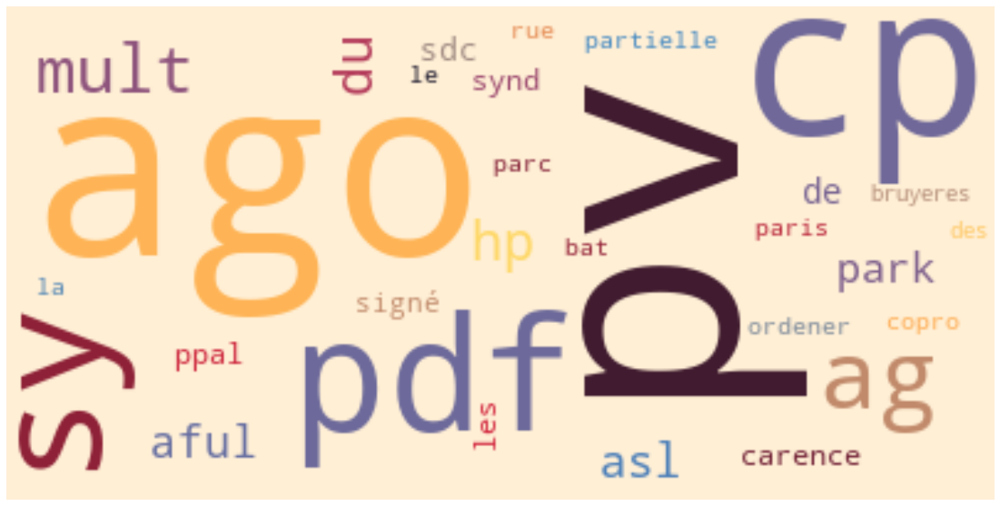

Mots les plus fréquents de la catégorie : pvcp202


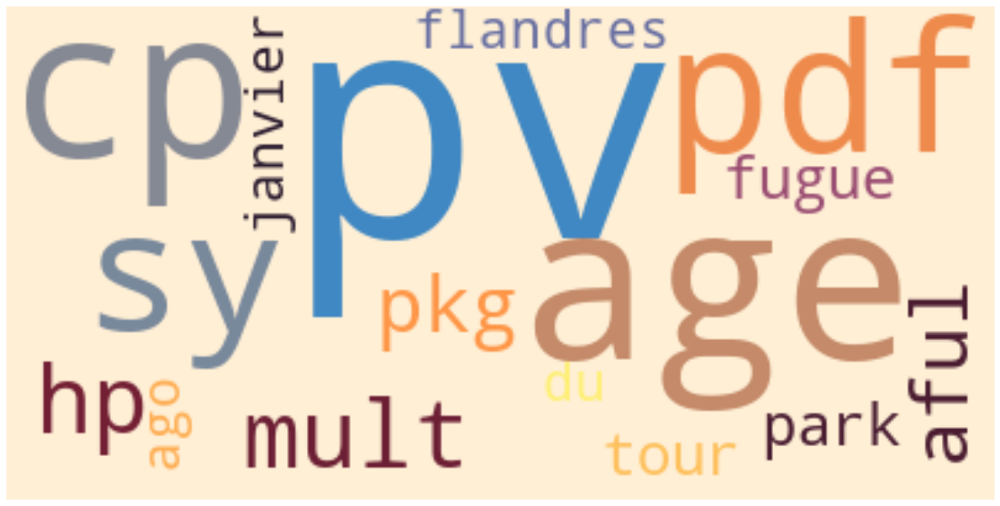

Mots les plus fréquents de la catégorie : pvcp203


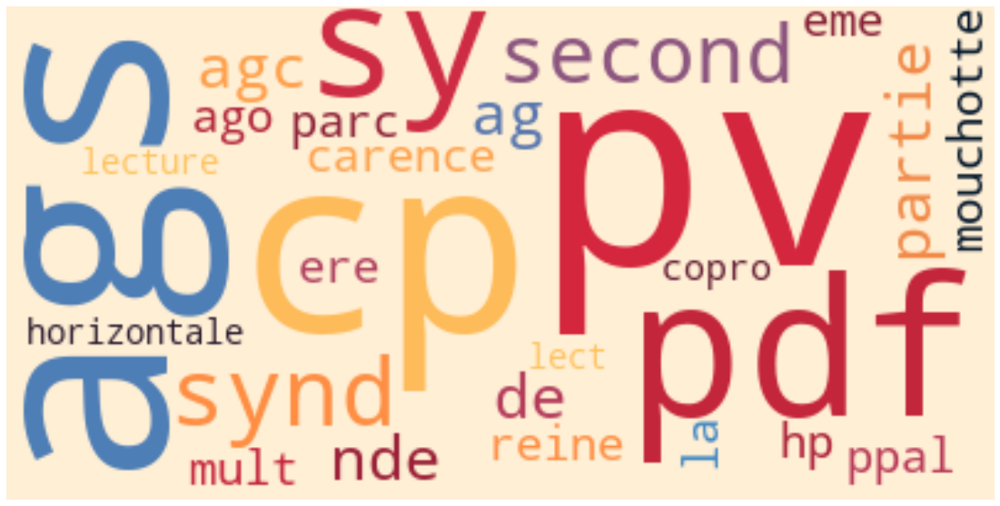

Mots les plus fréquents de la catégorie : pvcp204


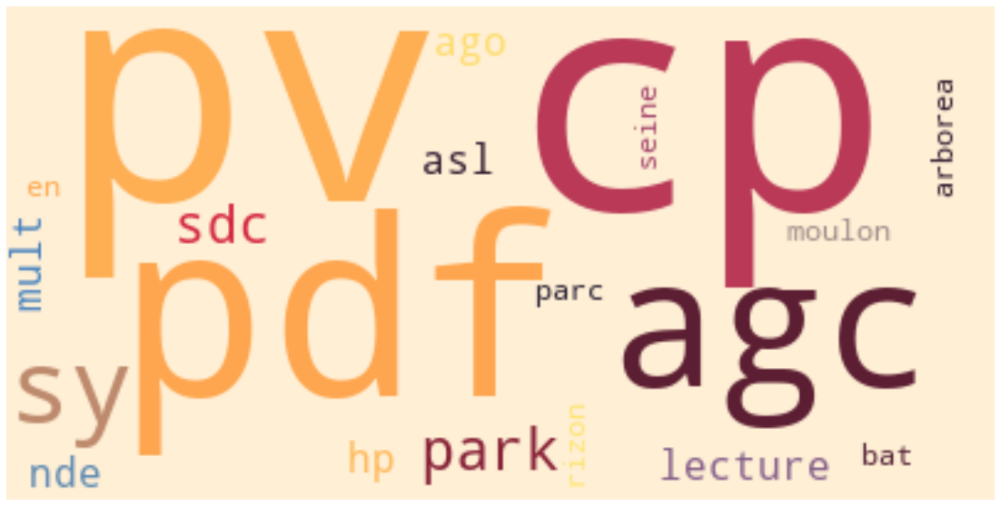

Mots les plus fréquents de la catégorie : pvcp301


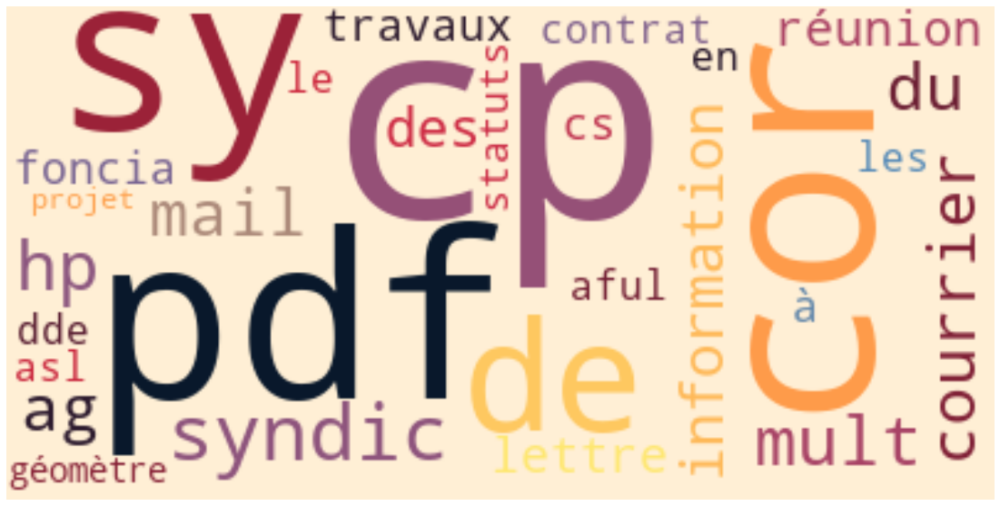

Mots les plus fréquents de la catégorie : pvcp501


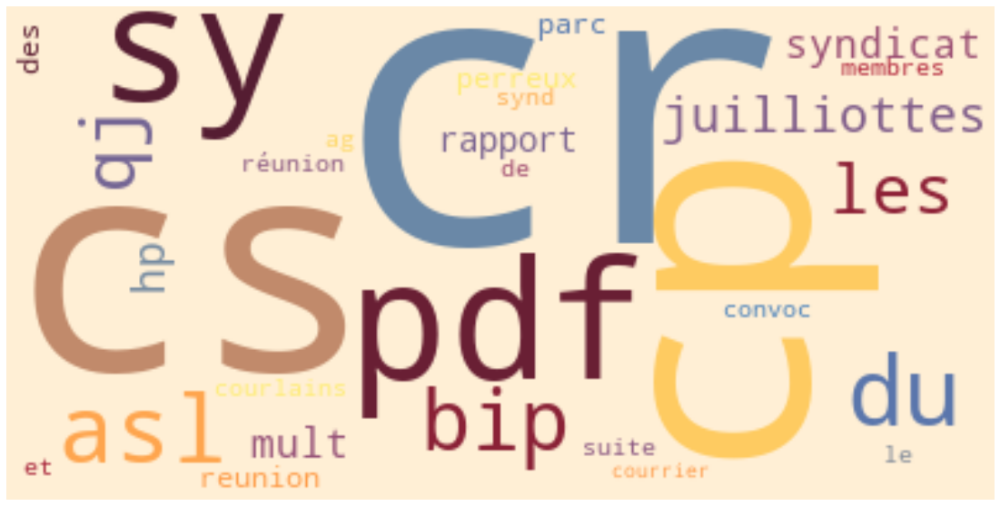

Mots les plus fréquents de la catégorie : pvcp601


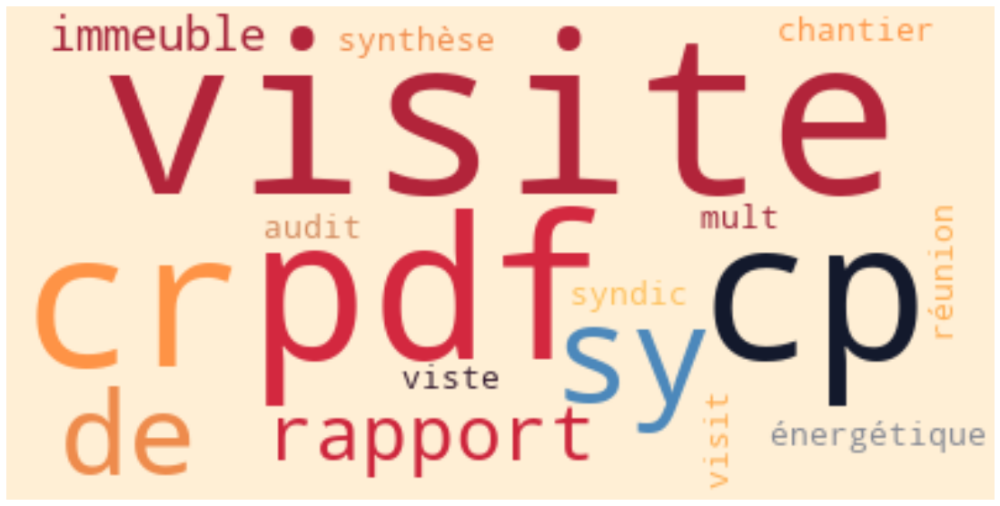

In [62]:
outils_visu.affiche_wordcloud_hue(df_work, 'title_clean',
                                  'label', 30)

### <span style='background:PowderBlue'>3.6. LDA pour visualisation</span>

#### <span style='background:Moccasin'>Fonctions utiles</span>

In [63]:
def get_good_tokens(sentence):
    replaced_punctation = list(map(lambda token: re.sub('[^0-9A-Za-z]+', '', token), sentence))
    removed_punctation = list(filter(lambda token: token, replaced_punctation))
    return removed_punctation

In [64]:
def w2v_preprocessing(df, col):
    """ All the preprocessing steps for word2vec are done in this function.
    All mutations are done on the dataframe itself. So this function returns
    nothing.
    """
    df[col] = df[col].str.lower()
    df[col] = hero.remove_digits(df[col], only_blocks=False )
    df['document_sentences'] = df[col].str.split('.')  # split texts into individual sentences
    df['tokenized_sentences'] = list(map(lambda sentences:
                                         list(map(nltk.word_tokenize, sentences)),
                                         df['document_sentences']))  # tokenize sentences
    df['tokenized_sentences'] = list(map(lambda sentences:
                                         list(map(get_good_tokens, sentences)),
                                         df['tokenized_sentences']))  # remove unwanted characters
    df['tokenized_sentences'] = list(map(lambda sentences:
                                         list(filter(lambda lst: lst, sentences)),
                                         df['tokenized_sentences']))  # remove empty lists

In [65]:
def lda_get_good_tokens(df, col):
    df[col] = df[col].str.lower()
    df['tokenized_text'] = list(map(nltk.word_tokenize, df[col]))
    df['tokenized_text'] = list(map(get_good_tokens, df['tokenized_text']))

In [66]:
def remove_stopwords(df):
    """ Removes stopwords based on a known set of stopwords
    available in the nltk package. In addition, we include our
    made up word in here.
    """
    # Luckily nltk already has a set of stopwords that we can remove from the texts.
    stopwords = stop_words

    df['stopwords_removed'] = list(map(lambda doc:
                                       [word for word in doc if word not in stopwords],
                                       df['tokenized_text']))

#### <span style='background:Moccasin'>Nettoyage pour LDA</span>

In [67]:
df_ascii = data[['title', 'texte', 'label']]
df_ascii = df_ascii.astype(np.str)
df_ascii

,title,texte,label
0,2004-CP101-#SY2004.1-#D201700-CONVOC AGO-Convocation AG 20-09-17.pdf,"\n\n \n\n7 ADRESSE IMMEUBLE -\n\nAFUT, MURAT\n\n4-22 PLACE DES MAITRES VIGNERONS\n92506 RUEIL MALMATSON\n\nMANDAT MEMBRE AFUL\n\nOGIF\n18 BIS RUE DE VILLIERS\n\n \n\n92594 LEVALLOIS-PERRET\n\n \n\n \n\n \n\n \n\nPOUVOIR\n\nJe soussigné{a)\n\nagissant en qualité de copropriétaire de l'immeuble précité constitue pour\nmandataire\n\nou à son défaut :\n\npour me représenter à l'assemblée générale : AFUL MURAT\n\npour le 20 SEPTEMBRE 2017\n\n| En conséquence, assister à l'assemblée, signer ies feuilles de\nprésence et toutes autres Pièces, prendre part À toutes les délibérations, émettre\n\ntous votes, sur les questions mentionnées à l'ordre du jour et généralement faire\nle nécessaire.\n\nIL est rappelé que le syndic ne peut pas représenter un copropriétaire et que\nchacun des copropriétaires ne peut recevoir que trois pouvoirs, Il peut recevoir\n\nplus de trois pouvoirs si 1e total des voix dont il dispose n'excède pas 5 % des\nvoix du syndicat.\n\nLe\nFaire précéder la signature de\...",CP101
1,1517-CP101-#SY1517.1-#D201900-CONVOC_AGO_20190624.pdf,"RECOMMANDEE AR. | de IMMEUBLE\n\n> Convocation à l’Assemblée générale ordinaire\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se\n\ntiendra le :\nLundi 24 Juin 2019à 18 H 00\n\nFONCIA SEINE OUEST\n10 RUE MAURICE BOKANOSWKI\n92600 ASNIERES-SUR-SEINE\n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. A défaut\nde majorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais\nsupplémentaires supportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Assemblée Générale, il vous est possible de vous y faire représenter\nà l'aide du pouvoir joint. Nous vous rappelons à ce sujet que le syndic ou son représentant ne peut\nrecevoir de pouvoir à son nom, en blanc et en faire utilisation, qu'un mandataire peut recevoir plus de\ntrois pouvoirs si le total des voix ...",CP101
2,2030-CP101-#SY2030.1-#D201800-CONVOC AGO-Convoc AG 140518.pdf,"\n\nRECOMMANDEE AR. IMMEUBLE\nLES DOMES RST\n\n2-4 RUE DES HAUTS DE CHANTURGUE\n30 RUE DU TORPILLEUR SIROCCO\n63100 CLERMONT-FERRAND\n\n> Convocation à l’Assemblée générale Annuelle <\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se tiendra\n\nle :\nLundi 14 Mai 2018 à 18 H 00\n\nSite LECLANCHE (salle 1)\nRue de Champratel\n63100 CLERMONT FERRAND\n\n \n\nREC""\n13 AVR, 2018\n\na |\n\n \n \n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nLes 7-16-17-21 résolutions nécessitent la majorité de l'article 25-1 de la loi.\nLes10-11-12-13 résolutions nécessitent la majorité de l'article 25 de la loi.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. À défaut de\nmajorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais supplémentaires\nsupportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Asse...",CP101
3,6352-CP101-#D201500-CONVOC AGO-4042.1-6352.1-Convocation AG RESIDENCE 3.04.15.pdf,"\n\n \n\n \n\nREGU\n\n \n\n \n \n\nTRAVAILLER EN TOUTE T\n\nle\n\n14 MARS 2015\nRÉQ sausnzs\n\nep ses NE\n\nTE\n\nRANSPARENCE, GEST ES\n\nSENTIEL,\n\nCompte-rendu de gestion annuel\n\n03 Mars 2015\n\nImmeuble\n\nRESIDENCE LES SABLONS-NOTRE DA\n1 À 20 RUE DES SABLONS 18 À 36 RUE DE LA\nBERTHIE 95870 BEZONS\n\n \n\nff 7] WA FONCIA cos\n\nConseil syndical\nM. BESTANT\n\nM. BITAR\n\nM BRANCO CALADO\n\nM DROUET/LATTE\n\n© MEL HARNANE\n\nM FRANCOÏS/ELIENT\nM LEGRAND\n\nM REDDAF\n\nHE\n\nL' iMinabliler clair, net 3 pr écis\n\nVos interlocuteurs FONCIA\n\nJean-Michel PIMONT\nDirecteur d'agence\n\nTél. 01.39.68.76.81.\njean-michel.pimont@foncia.fr\n\nRosa MARTINS\n\nAssistante copropri

In [68]:
w2v_preprocessing(df_ascii, 'title')

In [69]:
lda_get_good_tokens(df_ascii, 'title')

In [70]:
# liste élargie de stop words
stop_words = list(get_stop_words("fr"))         # About 900 stopwords
nltk_words = list(stopwords.words("french"))   # About 150 stopwords
stop_words.extend(nltk_words)

In [71]:
remove_stopwords(df_ascii)

In [72]:
df_ascii.head(1)

,title,texte,label,document_sentences,tokenized_sentences,tokenized_text,stopwords_removed
0,-cp -#sy . -#d -convoc ago-convocation ag - - .pdf,"\n\n \n\n7 ADRESSE IMMEUBLE -\n\nAFUT, MURAT\n\n4-22 PLACE DES MAITRES VIGNERONS\n92506 RUEIL MALMATSON\n\nMANDAT MEMBRE AFUL\n\nOGIF\n18 BIS RUE DE VILLIERS\n\n \n\n92594 LEVALLOIS-PERRET\n\n \n\n \n\n \n\n \n\nPOUVOIR\n\nJe soussigné{a)\n\nagissant en qualité de copropriétaire de l'immeuble précité constitue pour\nmandataire\n\nou à son défaut :\n\npour me représenter à l'assemblée générale : AFUL MURAT\n\npour le 20 SEPTEMBRE 2017\n\n| En conséquence, assister à l'assemblée, signer ies feuilles de\nprésence et toutes autres Pièces, prendre part À toutes les délibérations, émettre\n\ntous votes, sur les questions mentionnées à l'ordre du jour et généralement faire\nle nécessaire.\n\nIL est rappelé que le syndic ne peut pas représenter un copropriétaire et que\nchacun des copropriétaires ne peut recevoir que trois pouvoirs, Il peut recevoir\n\nplus de trois pouvoirs si 1e total des voix dont il dispose n'excède pas 5 % des\nvoix du syndicat.\n\nLe\nFaire précéder la signature de\...",CP101,"[ -cp -#sy , -#d -convoc ago-convocation ag - - , pdf]","[[cp, sy], [d, convoc, agoconvocation, ag], [pdf]]","[cp, sy, d, convoc, agoconvocation, ag, pdf]","[cp, sy, convoc, agoconvocation, ag, pdf]"
1,-cp -#sy . -#d -convoc_ago_ .pdf,"RECOMMANDEE AR. | de IMMEUBLE\n\n> Convocation à l’Assemblée générale ordinaire\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se\n\ntiendra le :\nLundi 24 Juin 2019à 18 H 00\n\nFONCIA SEINE OUEST\n10 RUE MAURICE BOKANOSWKI\n92600 ASNIERES-SUR-SEINE\n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. A défaut\nde majorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais\nsupplémentaires supportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Assemblée Générale, il vous est possible de vous y faire représenter\nà l'aide du pouvoir joint. Nous vous rappelons à ce sujet que le syndic ou son représentant ne peut\nrecevoir de pouvoir à son nom, en blanc et en faire utilisation, qu'un mandataire peut recevoir plus de\ntrois pouvoirs si le total des voix ...",CP101,"[ -cp -#sy , -#d -convoc_ago_ , pdf]","[[cp, sy], [d, convocago], [pdf]]","[cp, sy, d, convocago, pdf]","[cp, sy, convocago, pdf]"
2,-cp -#sy . -#d -convoc ago-convoc ag .pdf,"\n\nRECOMMANDEE AR. IMMEUBLE\nLES DOMES RST\n\n2-4 RUE DES HAUTS DE CHANTURGUE\n30 RUE DU TORPILLEUR SIROCCO\n63100 CLERMONT-FERRAND\n\n> Convocation à l’Assemblée générale Annuelle <\n\nMadame, Mademoiselle, Monsieur,\n\nNous vous remercions de bien vouloir participer à l'Assemblée Générale des Copropriétaires qui se tiendra\n\nle :\nLundi 14 Mai 2018 à 18 H 00\n\nSite LECLANCHE (salle 1)\nRue de Champratel\n63100 CLERMONT FERRAND\n\n \n\nREC""\n13 AVR, 2018\n\na |\n\n \n \n\nà l'effet de délibérer sur l'ordre du jour joint.\n\nLes 7-16-17-21 résolutions nécessitent la majorité de l'article 25-1 de la loi.\nLes10-11-12-13 résolutions nécessitent la majorité de l'article 25 de la loi.\n\nEn conséquence, il est important que tous les copropriétaires soient présents ou représentés. À défaut de\nmajorité, une nouvelle Assemblée Générale pourrait être tenue, mais génératrice de frais supplémentaires\nsupportés par tous les copropriétaires.\n\nSi vous ne pouviez être présent à l'Asse...",CP101,"[ -cp -#sy , -#d -convoc ago-convoc ag , pdf]","[[cp, sy], [d, convoc, agoconvoc, ag], [pdf]]","[cp, sy, d, convoc, agoconvoc, ag, pdf]","[cp, sy, convoc, agoconvoc, ag, pdf]"
3,-cp -#d -convoc ago- . - . -convocation ag residence . . .pdf,"\n\n \n\n \n\nREGU\n\n \n\n \n \n\nTRAVAILLER EN TOUTE T\n\nle\n\n14 MARS 2015\nRÉQ sausnzs\n\nep ses NE\n\nTE\n\nRANSPARENCE, GEST ES\n\nSENTIEL,\n\nCompte-rendu de gestion annuel\n

In [73]:
pd.set_option('display.max_colwidth', 500)
df_ascii.iloc[0,3:8].to_frame()

,0
document_sentences,"[ -cp -#sy , -#d -convoc ago-convocation ag - - , pdf]"
tokenized_sentences,"[[cp, sy], [d, convoc, agoconvocation, ag], [pdf]]"
tokenized_text,"[cp, sy, d, convoc, agoconvocation, ag, pdf]"
stopwords_removed,"[cp, sy, convoc, agoconvocation, ag, pdf]"


Text(0.5, 1.0, 'Word Frequencies')

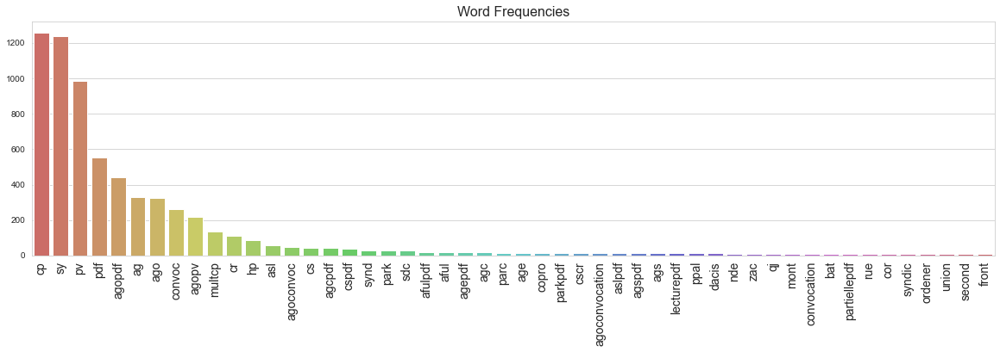

In [74]:
from collections import Counter
stopwords_removed_dict = Counter(np.concatenate(df_ascii.stopwords_removed.values))

stopwords_removed_df = pd.DataFrame.from_dict(stopwords_removed_dict, orient='index')
stopwords_removed_df.rename(columns={0: 'count'}, inplace=True)
stopwords_removed_df.sort_values('count', ascending=False, inplace=True)

def word_frequency_barplot(df, nr_top_words=50):
    """ df should have a column named count.
    """
    fig, ax = plt.subplots(1,1,figsize=(20,5))
    sns.barplot(list(range(nr_top_words)), df['count'].values[:nr_top_words], palette='hls', ax=ax)
    ax.set_xticks(list(range(nr_top_words)))
    ax.set_xticklabels(df.index[:nr_top_words], fontsize=14, rotation=90)
    return ax
    
ax = word_frequency_barplot(stopwords_removed_df)
ax.set_title("Word Frequencies", fontsize=16)

In [75]:
CP101_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'CP101', 'stopwords_removed'].values))
CP103_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'CP103', 'stopwords_removed'].values))
cp102_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'cp102', 'stopwords_removed'].values))
cp104_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'cp104', 'stopwords_removed'].values))
pvcp201_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp201', 'stopwords_removed'].values))
pvcp202_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp202', 'stopwords_removed'].values))
pvcp203_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp203', 'stopwords_removed'].values))
pvcp204_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp204', 'stopwords_removed'].values))
pvcp301_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp301', 'stopwords_removed'].values))
pvcp501_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp501', 'stopwords_removed'].values))
pvcp601_words = list(np.concatenate(df_ascii.loc[df_ascii.label == 'pvcp601', 'stopwords_removed'].values))

In [76]:
CP101_frequencies = {word: CP101_words.count(word) for word in stopwords_removed_df.index[:50]}
CP103_frequencies = {word: CP103_words.count(word) for word in stopwords_removed_df.index[:50]}
cp102_frequencies = {word: cp102_words.count(word) for word in stopwords_removed_df.index[:50]}
cp104_frequencies = {word: cp104_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp201_frequencies = {word: pvcp201_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp202_frequencies = {word: pvcp202_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp203_frequencies = {word: pvcp203_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp204_frequencies = {word: pvcp204_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp301_frequencies = {word: pvcp301_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp501_frequencies = {word: pvcp501_words.count(word) for word in stopwords_removed_df.index[:50]}
pvcp601_frequencies = {word: pvcp601_words.count(word) for word in stopwords_removed_df.index[:50]}

In [77]:
frequencies_df = pd.DataFrame(index=stopwords_removed_df.index[:50])

In [78]:
frequencies_df['1label'] = list(map(lambda word:
                                      CP101_frequencies[word],
                                      frequencies_df.index))
frequencies_df['2labels'] = list(map(lambda word:
                                          CP101_frequencies[word] + CP103_frequencies[word],
                                          frequencies_df.index))
frequencies_df['3labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word],
                                              frequencies_df.index))
frequencies_df['4labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word], frequencies_df.index))
frequencies_df['5labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word], frequencies_df.index))
frequencies_df['6labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word] 
                                              + pvcp202_frequencies[word], frequencies_df.index))
frequencies_df['7labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word] 
                                              + pvcp202_frequencies[word] + pvcp203_frequencies[word], frequencies_df.index))
frequencies_df['8labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word] 
                                              + pvcp202_frequencies[word] + pvcp203_frequencies[word] + pvcp204_frequencies[word], frequencies_df.index))
frequencies_df['9labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word] 
                                              + pvcp202_frequencies[word] + pvcp203_frequencies[word] + pvcp204_frequencies[word] + pvcp301_frequencies[word], frequencies_df.index))
frequencies_df['10labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word] 
                                              + pvcp202_frequencies[word] + pvcp203_frequencies[word] + pvcp204_frequencies[word]
                                              + pvcp301_frequencies[word] + pvcp501_frequencies[word], frequencies_df.index))
frequencies_df['11labels'] = list(map(lambda word:
                                              CP101_frequencies[word] + CP103_frequencies[word] + cp102_frequencies[word]
                                              + cp104_frequencies[word] + pvcp201_frequencies[word] 
                                              + pvcp202_frequencies[word] + pvcp203_frequencies[word] + pvcp204_frequencies[word]
                                              + pvcp301_frequencies[word] + pvcp501_frequencies[word] + pvcp601_frequencies[word], frequencies_df.index))

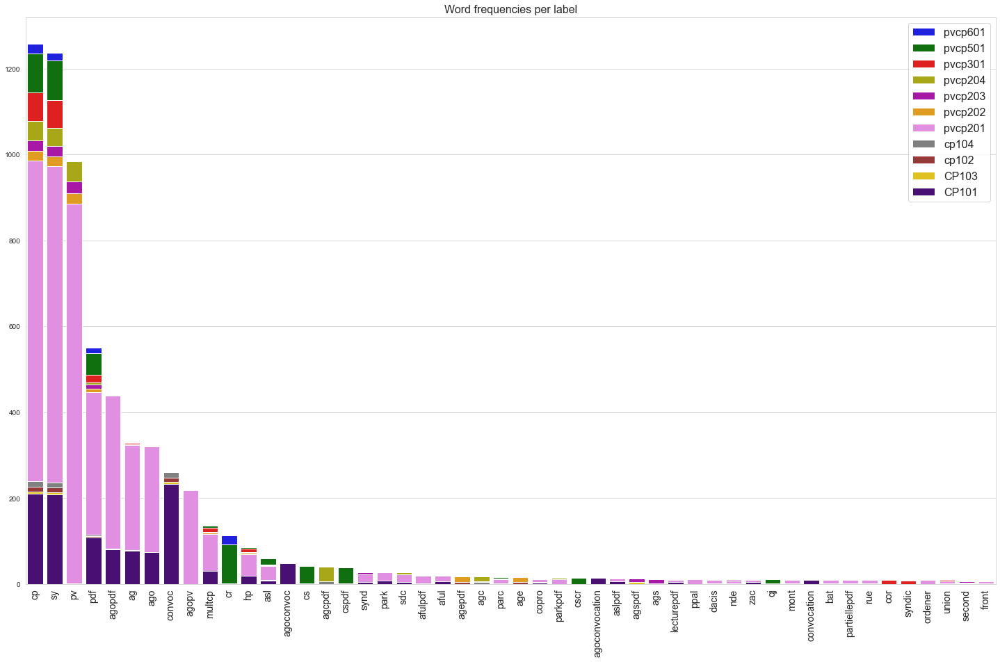

In [79]:
fig, ax = plt.subplots(1,1,figsize=(25,15))

nr_top_words = len(frequencies_df)
nrs = list(range(nr_top_words))
sns.barplot(nrs, frequencies_df['11labels'] .values, color='b', ax=ax, label="pvcp601")
sns.barplot(nrs, frequencies_df['10labels'].values, color='g', ax=ax, label="pvcp501")
sns.barplot(nrs, frequencies_df['9labels'].values, color='r', ax=ax, label="pvcp301")
sns.barplot(nrs, frequencies_df['8labels'].values, color='y', ax=ax, label="pvcp204")
sns.barplot(nrs, frequencies_df['7labels'].values, color='m', ax=ax, label="pvcp203")
sns.barplot(nrs, frequencies_df['6labels'].values, color='orange', ax=ax, label="pvcp202")
sns.barplot(nrs, frequencies_df['5labels'].values, color='violet', ax=ax, label="pvcp201")
sns.barplot(nrs, frequencies_df['4labels'].values, color='gray', ax=ax, label="cp104")
sns.barplot(nrs, frequencies_df['3labels'].values, color='brown', ax=ax, label="cp102")
sns.barplot(nrs, frequencies_df['2labels'].values, color='gold', ax=ax, label="CP103")
sns.barplot(nrs, frequencies_df['1label'].values, color='indigo', ax=ax, label="CP101")

ax.set_title("Word frequencies per label", fontsize=16)
ax.legend(prop={'size': 16})
ax.set_xticks(nrs)
ax.set_xticklabels(frequencies_df.index, fontsize=14, rotation=90);

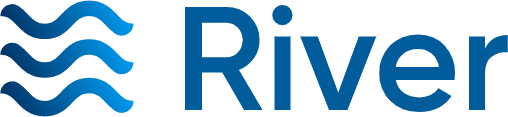

In [80]:
from pyquickhelper.helpgen import NbImage
NbImage("river_logo.png")

# <span style='background:Thistle'>OUTILS pour Online /Incremental Machine Learning </span> 
Outils d'apprentissage automatique en ligne/en différé

+ Offline ML Learning : icela signifie que nous avons un lot de données, et que nous optimisons une équation pour faire une prédiction. 
+ Online ML learning: utilisé lorsque nous avons des données en continu, où nous voulons traiter un échantillon de données à la fois.
    - données en temps réel, une observation à la fois
    - mise à jour des estimations à l'arrivée de chaque nouveau point de données plutôt que d'attendre la "fin" (qui peut ne jamais se produire).
+ L'apprentissage incrémental est une méthode d'apprentissage automatique dans laquelle les données d'entrée sont utilisées en permanence pour étendre les connaissances du modèle existant, c'est-à-dire pour poursuivre l'entraînement du modèle. 
+ Il s'agit d'une technique dynamique d'apprentissage supervisé et d'apprentissage non supervisé qui peut être appliquée lorsque les données d'apprentissage deviennent progressivement disponibles au fil du temps ou que leur taille dépasse les limites de la mémoire du système.
+ The AIM
    - le modèle d'apprentissage s'adapte aux nouvelles données sans oublier ses connaissances existantes.


- [x] __Outils pour Incremental or Online ML__
+ River
    - Creme
    - Scikit-Multiflow
+ MOA
+ SAMOA
+ StreamDB (spark streaming)


- [x] __Utilité__
+ Pour Online ML 
+ Pour le ML on streaming data


- [x] __Défis__
+ Difficile à gérer
    - Très adaptatif
+ Plus de niveaux de recherche


- [x] __Installation__
+ pip install river
+ pip install creme
+ pip install scikit-multiflow

In [81]:
# Constitution des dataframes de travail pour river
df_clean = df_work[["title_clean", "texte_clean", "label"]]
df_stem = df_work[["title_stem", "texte_clean_stem", "label"]]
df_lemma = df_work[["title_lemma", "texte_clean_lemma", "label"]]
df_texte_clean = df_work[["texte_clean", "label"]]
df_ascii_cleantexte = df_ascii[["stopwords_removed", "label"]]

In [82]:
import texthero as hero
# Fonction de nettoyage complet 

def preprocess_text(df, col):
         
    # lowercase all texts in a series
    df[col] = hero.lowercase(df[col])
    
    
    # remove all digits (worddigit)
    df[col] = hero.remove_digits(df[col], only_blocks=False)
    
    
    # Remove stopwords
    df[col] = hero.remove_stopwords(df[col])
    
        
    # Remove whitespace
    df[col] = hero.remove_whitespace(df[col])
    
    
    # Remove punctuation            
    df[col] = hero.remove_punctuation(df[col])
    
    
    # Remove diacritics            
    df[col] = hero.remove_diacritics(df[col])   
    
    return df

In [83]:
preprocess_text(df_texte_clean, 'texte_clean')

,texte_clean,label
0,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigne agissant qualite coproprietaire immeuble precite constitue mandataire defaut representer aful murat septembre consequence assister signer ies feuilles presence toutes autres pieces prendre part toutes deliberations emettre votes questions mentionnees ordre jour generalement necessaire rappele representer coproprietaire chacun recevoir trois pouvoirs recevoir p...,CP101
1,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet deliberer ordre jour joint consequence important presents representes defaut majorite nouvelle pourrait tenue generatrice frais supplementaires supportes pouviez present possible representer aide pouvoir joint rappelons representant recevoir pouvoir blanc utilisation mandataire recevoir plus trois pou...,CP101
2,recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet deliberer ordre jour joint resolutions necessitent majorite loi resolutions necessitent majorite loi consequence important presents representes defaut majorite nouvelle pourrait tenue generatrice frais supplementaires supportes p...,CP101
3,regu travailler toute mars ep gest compte rendu gestion annuel mars immeuble residence sablons da rue sablons rue berthie bezons ff wa foncia cos conseil syndical bitar branco calado drouet latte mel harnane elient legrand reddaf clair net pr interlocuteurs foncia jean michel pimont directeur agence tel jean michel pimont foncia fr rosa martins assistante copropriete tel martins foncia fr isabelle f comptable tel isabelle fodere foncia fe q compte rendu gestion copropriete annuel chere madam...,CP101
4,\ domsxis rue saint charles bp paris cedex comptables raphael fay gestionnaire kopp societe snr copropriete place cerclades cergy assemblee generale tiendra jeudi septembre adresse suivante antenne val oise domaxis immeuble soge rue verger cergy h service courtier recu jul paris recommande r reference nombre hp olb e sophie kopp madame monsieur pouvoir effet deliberer prions bien vouloir assister ordinaire tiendra jeudi septembre h antenne val oise domaxis immeuble rue verger cergy ordre jou...,CP101
5,domsxis rue saint charles bp paris cedex paris comptables raphael fay recommande r ol reference gestionnaire kopp societe snr copropriet societe snr chez ogif drno bis rue villiers levallois perret cedex assemblee generale tiendra jeudi janvier h adresse suivante nombre antenne val oise domaxis immeuble soge rue verger cergy madame monsieur prions bien vouloir assister ordinaire tiendra jeudi janvier h antenne oise domaxis immeuble soge rue verger cergy effet deliberer ordre jour apres rappe...,CP101
6,page nexity paris igh adresse immeuble boulevard vincent auriol zodiaque rc cs rue baudin courbevoie paris cedex www nexity fr immatriculation ab telephone paris cedex convocation assemblee ge cs nerale madame monsieur plaisir convier tiendra salle reception boulevard aristide briand courbevoie emargement feuille presence ouvert h pouviez present reunion demandons bien vouloir representer aide pouvoir joint rappelons loi juillet stipule coproprietaire deleguer droit vote mandataire dernier n...,CP101
7,el service courrier i jean charpentier regula ocr societe administration biens paris octobre societe li pi pyramide tour ariane defense paris defense rueil malmaison convocation messieurs cher coproprietaire honneur informer immeuble cite reference reuniront ordinaire bis rue ledru rollin suresnes cabinet charpentier agence suresnes deliberer questions inscrites ordre jour detaille annexe mercredi novembre h copropriete

In [84]:
df_work.to_csv('df_river.csv', index=False, encoding="utf8")
df_clean.to_csv('df_river_clean.csv', index=False, encoding="utf8")
df_stem.to_csv('df_river_stem.csv', index=False, encoding="utf8")
df_lemma.to_csv('df_river_lemma.csv', index=False, encoding="utf8")
df_texte_clean.to_csv('df_river_texte_clean.csv', index=False, encoding="utf8")
df_ascii_cleantexte.to_csv('df_river_ascii.csv', index=False, encoding="utf8")

# <span style='background:Thistle'>L'API RIVER</span>

Tous les modèles sont capables d'apprendre des données et de faire des prédictions.

Les modèles dans river ont la possibilité d'__apprendre à partir d'une seule instance__. 

Les modèles peuvent être mis à jour __rapidement chaque fois que de nouvelles données arrivent.__

- [x] __learn_one(x, y)__ met à jour l'état interne du modèle en fonction d'une nouvelle observation contenant des caractéristiques en entrée x et une valeur cible y.
- [x] __predict_one__ (classification, régression, clustering) renvoie la prédiction du modèle pour une seule observation
- [x] __predict_proba_one__ (classification) renvoie la probabilité prédite du modèle pour une seule observation
- [x] __score_one__ (détection d'anomalies) renvoie le score aberrant pour une seule observation
- [x] __transform_one__ transforme une observation d'entrée

River s'attend à ce que les observations de données soient présentées __sous forme de dictionnaires Python__. 

Les clés du dictionnaire représentant les noms des variables.

Une structure de données de dictionnaire présente plusieurs avantages :
- [x] Les dictionnaires sont flexibles et ne sont pas dactylographiés. Ainsi, ils peuvent gérer des données éparses et de nouvelles fonctionnalités qui peuvent apparaître dans le flux de données.
- [x] Les données du dictionnaire sont légères et ne nécessitent pas la surcharge requise par une structure de données sophistiquée telle que numpy.ndarray ou pandas.DataFrame. 

__Cela facilite le traitement rapide des observations individuelles dans un contexte de streaming.__

In [85]:
# Load ML Pkgs
import river

In [86]:
# Method
dir(river);

In [87]:
# Load Estimators
from river.linear_model import LogisticRegression
from river.naive_bayes import MultinomialNB as MNB_RIVER
from river.feature_extraction import BagOfWords,TFIDF
from sklearn import datasets
from river import stream
from river import compose
from river.compose import Pipeline
from river import linear_model
from river import optim
from river import preprocessing
from river import metrics
from river import feature_extraction
from river.naive_bayes import ComplementNB
from river.naive_bayes import MultinomialNB as MNB_RIVER
from river.naive_bayes import GaussianNB

In [88]:
def get_all_attributes(package):
    subpackages = []
    submodules = []
    for i in dir(package):
        if str(i) not in ["__all__", "__builtins__", "__cached__", "__doc__", "__file__", "__loader__", "__name__", "__package__", "__path__", "__pdoc__", "__spec__", "__version__"]:
            subpackages.append(i)
            res = [j for j in dir(eval("river.{}".format(i)))]
            submodules.append(res)
    df = pd.DataFrame(submodules)
    # Transpose
    df = df.T
    df.columns = subpackages
    res_df = df.dropna()
    return res_df

In [89]:
river_df = get_all_attributes(river)
river_df

,anomaly,base,cluster,compat,...,synth,time_series,tree,utils
0,HalfSpaceTrees,AnomalyDetector,CluStream,PyTorch2RiverRegressor,...,Agrawal,Detrender,ExtremelyFastDecisionTreeClassifier,Histogram
1,__all__,Base,DBSTREAM,River2SKLClassifier,...,AnomalySine,GroupDetrender,HoeffdingAdaptiveTreeClassifier,SDFT
2,__builtins__,Classifier,DenStream,River2SKLClusterer,...,ConceptDriftStream,SNARIMAX,HoeffdingAdaptiveTreeRegressor,Skyline
3,__cached__,Clusterer,KMeans,River2SKLRegressor,...,Friedman,__all__,HoeffdingTreeClassifier,SortedWindow
4,__doc__,DriftDetector,STREAMKMeans,River2SKLTransformer,...,FriedmanDrift,__builtins__,HoeffdingTreeRegressor,VectorDict
5,__file__,EnsembleMixin,__all__,SKL2RiverClassifier,...,Hyperplane,__cached__,LabelCombinationHoeffdingTreeClassifier,Window
6,__loader__,Estimator,__builtins__,SKL2RiverRegressor,...,LED,__doc__,SGTClassifier,__all__
7,__name__,MiniBatchClassifier,__cached__,__all__,...,LEDDrift,__file__,SGTRegressor,__builtins__
8,__package__,MiniBatchRegressor,__doc__,__annotations__,...,Logical,__loader__,__all__,__cached__
9,__path__,MultiOutputMixin,__file__,__builtins__,...,Mixed,__name__,__builtins__,__doc__


## <span class="bg-info">4. Feature extraction - Words embeddings</span>

- L’hypothèse de distribution en linguistique est dérivée de la théorie sémantique de l'usage de la langue, c'est-à-dire que les mots utilisés et utilisés dans les mêmes contextes ont tendance à avoir des significations similaires.
- Le word embedding repose sur une découverte : la régularité de certains rapports qui permettent de jouer le sens par un calcul vectoriel.
- Le monde du machine learning apporte une innovation remarquable : la **vectorisation**. 
- Le principe est simple. À partir de la matrice termes-document, on peut aisément construire des tables de corrélations entre les termes. L’idée est de représenter ces corrélations le plus précisément possible pour garder toute l'information dans un espace de dimension arbitrairement grande. L’idée est moins de réduire que de conserver l’information et le choix est de représenter chaque terme dans un espace de 100 à 1000 dimensions.
- L'astuce est le sac de mot (bag of words). Un petit ou un grand ? Considère-t-on que deux termes sont similaires s’ils font partie d’un paquet de 5 mots ou de 40 mots ? C’est bien plus qu’une astuce, cela devient le paramètre de l’analyse, favoriser de petits sacs, c’est chercher les termes qui sont directement associés, de plus grands sacs permettent de mieux prendre en compte le contexte des termes. Le paramètre de la taille du sac traduit la stratégie de recherche : les compléments ou les contextes.
- Le words embeddings constitue les techniques traditionnelles et anciennes du NLP.

Comme nous avons normalisé, nettoyé, supprimé les stopwords, les mots les plus fréquents et les mots les plus rares et préparer les variables lemmatisées et racinisées, nous utiliserons le constructeur par défaut sur les variables 'texte' et 'title' lemmatisées ou racinisées.

### <span class="bg-success">4.1. BOW - Bags of words </span>

***Note*** :
***
- CountVectorizer convertit une collection de documents texte en une matrice de comptage de tokens : les occurrences des tokens dans chaque document. 
- Cette implémentation produit une représentation éparse, creuse du nombre de tokens.
- La fonction "count vectorizer" de la librairie scikit-learn de Python, fournit un index à chaque mot et génère un vecteur qui contient le nombre d'apparitions de chaque mot dans un morceau de texte.
- fit permet d'apprendre le vocabulaire d'un ensemble de textes.
- transform permet la transformation en un cadre de données pouvant être utilisé pour construire des modèles de machine learning.

#### <span style='background:Moccasin'>Chargement de la librairie et préparation</span>

In [90]:
# Load Estimators
from river.linear_model import LogisticRegression
from river.naive_bayes import MultinomialNB as MNB_RIVER
from river.feature_extraction import BagOfWords,TFIDF
from river import linear_model
import typing
import pandas as pd
from river import base, stream
#  Make a Pipeline
from river.compose import Pipeline
# Classification
from river.metrics import ClassificationReport

In [91]:
# Constitution des dataframes de travail pour river
df_clean = df_work[["title_clean", "texte_clean", "label"]]
df_stem = df_work[["title_stem", "texte_clean_stem", "label"]]
df_lemma = df_work[["title_lemma", "texte_clean_lemma", "label"]]
df_texte_clean = df_work[["texte_clean", "label"]]
df_title_clean = df_work[["title_clean", "label"]]
df_ascii_cleantexte = df_ascii[["stopwords_removed", "label"]]

#### <span style='background:Moccasin'>MultinomialNB Avec RIVER pour comparaison</span>

<span class="bg-info">Séparation du jeu de données train/test<span>

In [92]:
df_texte_clean = df_work[["texte_clean", "label"]]
df_texte_clean.head(3)

,texte_clean,label
0,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer ies feuilles présence toutes autres pièces prendre part toutes délibérations émettre votes questions mentionnées ordre jour généralement nécessaire rappelé représenter coproprié...,CP101
1,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représe...,CP101
2,recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle po...,CP101


In [93]:
df_texte_clean = df_texte_clean.astype(np.str)

In [94]:
#X = df_texte_clean.drop('label', axis=1)
X = df_texte_clean
y = df_texte_clean.pop('label')
X.head()

,texte_clean
0,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer ies feuilles présence toutes autres pièces prendre part toutes délibérations émettre votes questions mentionnées ordre jour généralement nécessaire rappelé représenter coproprié...
1,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représe...
2,recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle po...
3,regu travailler toute mars ep gest compte rendu gestion annuel mars immeuble residence sablons da rue sablons rue berthie bezons ff wa foncia cos conseil syndical bitar branco calado drouet latte mel harnane elient legrand reddaf clair net pr interlocuteurs foncia jean michel pimont directeur agence tél jean michel pimont foncia fr rosa martins assistante copropriété tél martins foncia fr isabelle f comptable tél isabelle fodere foncia fe q compte re...
4,\ domsxis rue saint charles bp paris cedex comptables raphael fay gestionnaire kopp société snr copropriete place cerclades cergy assemblee generale tiendra jeudi septembre adresse suivante antenne val oise domaxis immeuble soge rue verger cergy h service courtier reçu jul paris recommande r référence nombre hp olb e sophie kopp madame monsieur pouvoir effet délibérer prions bien vouloir assister ordinaire tiendra jeudi septembre h antenne val...


In [95]:
from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1115, 1), (1115,), (279, 1), (279,))

<span class="bg-info">Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)<span>

In [96]:
data_stream_texte_train = stream.iter_pandas(X_train, y_train)

In [97]:
from pprint import pprint
for x, y in data_stream_texte_train:
    pprint(x)
    pprint(y)
    break

{'texte_clean': 'sylvie da fonseca  conseil syndical quai largo quailargo '
                'conseilsyndical gmail com envoyé samedi février  quailargo '
                'conseilsyndical gmail com cc bourgetel nicolas  marie '
                'caroline objet newsletter  conseil syndical  quai largo '
                'bonjour    conseil syndical  confirme  dernière actualité   '
                'prochaines échéances  prendre  compte  souhaitant   point   '
                'craintes         assurés   ensemble    neuvième quartier '
                'agréable  vivre       bientôt  conseil syndical  pris bonne '
                'note  indications communiquées   élus   reçus  genèse  '
                'premiers riverains   marina  arrivés  pendant  confinement  '
                'côté  zones   marina     réceptionné   jour            fin   '
                'construction  bâtiment    angle  minimum  chantier fera   '
                'objet    rétrocession  eiffage vers  mairie        date  '

<span class="bg-info">Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)<span>

In [98]:
data_stream_texte_test = stream.iter_pandas(X_test, y_test)

In [99]:
from pprint import pprint
for x, y in data_stream_texte_test:
    pprint(x)
    pprint(y)
    break

{'texte_clean': 'socerm  habitation bureau gestion  restaurants inter '
                'entreprises assistant  bénévole achat vente gérance socerm '
                'achat vente location gérance   copropriétés bis rue hervet '
                'rueil malmaison bis rue rené cassin rueil malmaison tél fax '
                'tél fax email transaction socerm com email copropriete socerm '
                'com aful zac  godardes rueil malmaison assemblee generale  '
                'mai  h chez socerm bis rue rene cassin rueil malmaison socerm '
                'siège social bis rue rené cassin  rueil malmaison site '
                'internet www socerm com   r   capital   r   nanterre b  '
                'siret  code nace z code ape   tva cee fr cartes '
                'professionnelles gestion   transactions  délivrées   '
                'préfecture  nanterre  garanties socaf compte bancaire crédit '
                'mutuel  rueil malmaison ordre  jour nomination  president  '
       

<span class="bg-info">Modélisation - Pipeline avec RIVER<span>

In [100]:
#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

In [101]:
### Visualize the Pipeline
pipe_nb

Pipeline (
  BagOfWords (
    on="texte_clean"
    strip_accents=False
    lowercase=False
    preprocessor=None
    tokenizer=<built-in method findall of re.Pattern object at 0x000001E3178BFED0>
    ngram_range=(1, 1)
  ),
  MultinomialNB (
    alpha=1.
  )
)

In [102]:
pipe_nb.steps

OrderedDict([('vectorizer',
              BagOfWords (
                on="texte_clean"
                strip_accents=False
                lowercase=False
                preprocessor=None
                tokenizer=<built-in method findall of re.Pattern object at 0x000001E3178BFED0>
                ngram_range=(1, 1)
              )),
             ('nb',
              MultinomialNB (
                alpha=1.
              ))])

In [103]:
# Fit on our data
# Learn one at a time
# learn_one(for river)/ fit_one(for creme)
# predict_one

for text,label in data_stream_texte_train:
    # print(label)
    pipe_nb = pipe_nb.learn_one(text,label)

<span class="bg-info">Essai de prédiction à partir d'une nouvelle donnée avec RIVER<span>

In [104]:
# Make Prediction
pipe_nb.predict_one({'texte_clean': 'ecommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais'})

'CP101'

In [105]:
# Make Prediction
pipe_nb.predict_proba_one({'texte_clean': 'ecommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais'})

{'pvcp501': 8.720019249765656e-13,
 'CP101': 0.9954056048562336,
 'pvcp201': 0.004587371762663783,
 'pvcp301': 2.3135851774267086e-07,
 'cp104': 1.4845396849941437e-13,
 'pvcp202': 5.18383031313005e-15,
 'pvcp203': 2.2235025599470486e-12,
 'cp102': 3.2816008316212413e-12,
 'pvcp204': 6.792016072540078e-06,
 'pvcp601': 2.0528646913802705e-32,
 'CP103': 1.2724500967361663e-32}

<span class="bg-info">Prédiction avec RIVER<span>

In [106]:
y_pred = []
for x,y in data_stream_texte_test:
    #print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

In [107]:
#print(y_test)

In [108]:
#print(y_pred)

In [109]:
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

In [110]:
# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_texte_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

In [111]:
report

           Precision   Recall   F1      Support  
                                                 
   CP101       0.155    0.188   0.170        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.572    0.524   0.547       166  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.083    0.133   0.103        15  
 pvcp501       0.074    0.105   0.087        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.080    0.086   0.082            
   Micro       0.360    0.360   0.360            
Weighted       0.378    0.360   0.368            

                 36.0% accuracy                  

In [112]:
############################     BagOfWords   Colonnes "texte_clean"   ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.627    0.771   0.692        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.862    0.784   0.821       167  
 pvcp202       0.500    0.200   0.286         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.357    0.500   0.417         1  
 pvcp301       0.417    0.667   0.513        15  
 pvcp501       0.519    0.737   0.609        19  
 pvcp601       1.000    0.200   0.333         5  
                                                 
   Macro       0.389    0.351   0.334            
   Micro       0.713    0.713   0.713            
Weighted       0.721    0.713   0.706            

                 71.3% accuracy                  

In [113]:
############################     BagOfWords   Colonnes "texte_clean_lemma"   ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean_lemma',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.673    0.771   0.718        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.865    0.808   0.836       167  
 pvcp202       0.500    0.200   0.286         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.417    0.500   0.455         1  
 pvcp301       0.385    0.667   0.488        15  
 pvcp501       0.519    0.737   0.609        19  
 pvcp601       1.000    0.200   0.333         5  
                                                 
   Macro       0.396    0.353   0.339            
   Micro       0.728    0.728   0.728            
Weighted       0.732    0.728   0.719            

                 72.8% accuracy                  

In [114]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.780    0.812   0.796        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.889    0.862   0.875       167  
 pvcp202       0.500    0.200   0.286         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.385    0.500   0.435         1  
 pvcp301       0.545    0.800   0.649        15  
 pvcp501       0.536    0.789   0.638        19  
 pvcp601       1.000    0.400   0.571         5  
                                                 
   Macro       0.421    0.397   0.386            
   Micro       0.781    0.781   0.781            
Weighted       0.773    0.781   0.770            

                 78.1% accuracy                  

In [115]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean_stem + title_stem      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_stem"] + " " + df_work["texte_clean_stem"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.735    0.750   0.742        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.873    0.826   0.849       167  
 pvcp202       0.333    0.200   0.250         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.500    0.500   0.500         1  
 pvcp301       0.429    0.800   0.558        15  
 pvcp501       0.500    0.737   0.596        19  
 pvcp601       1.000    0.200   0.333         5  
                                                 
   Macro       0.397    0.365   0.348            
   Micro       0.742    0.742   0.742            
Weighted       0.748    0.742   0.735            

                 74.2% accuracy                  

In [225]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean_lemma + title_lemma      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_lemma"] + " " + df_work["texte_clean_lemma"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.765    0.812   0.788        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.889    0.862   0.875       167  
 pvcp202       0.500    0.200   0.286         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.417    0.500   0.455         1  
 pvcp301       0.522    0.800   0.632        15  
 pvcp501       0.500    0.737   0.596        19  
 pvcp601       1.000    0.200   0.333         5  
                                                 
   Macro       0.417    0.374   0.360            
   Micro       0.774    0.774   0.774            
Weighted       0.768    0.774   0.761            

                 77.4% accuracy                  

In [235]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('Cnb', naive_bayes.ComplementNB()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.455    0.833   0.588        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.842    0.796   0.818       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.500    0.100   0.167         1  
 pvcp301       0.444    0.267   0.333        15  
 pvcp501       0.667    0.632   0.649        19  
 pvcp601       1.000    0.800   0.889         5  
                                                 
   Macro       0.355    0.312   0.313            
   Micro       0.695    0.695   0.695            
Weighted       0.687    0.695   0.675            

                 69.5% accuracy                  

In [237]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('Gnb', naive_bayes.GaussianNB()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.714    0.312   0.435        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.647    0.988   0.782       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.500    0.067   0.118        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.169    0.124   0.121            
   Micro       0.649    0.649   0.649            
Weighted       0.537    0.649   0.549            

                 64.9% accuracy                  

In [238]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('Gnb', tree.ExtremelyFastDecisionTreeClassifier(
grace_period=100,
split_confidence=1e-5,
nominal_attributes=["title_clean", 'texte_clean', 'texte_clean_lemma',"Title+Texte"],
min_samples_reevaluate=100)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [240]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################
from river import imblearn

# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('Gnb', imblearn.HardSamplingClassifier(
                                    classifier=naive_bayes.ComplementNB(), p=0.1, size=40, seed=42,)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.442    0.792   0.567        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.850    0.778   0.812       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.600    0.300   0.400         1  
 pvcp301       0.375    0.200   0.261        15  
 pvcp501       0.579    0.579   0.579        19  
 pvcp601       0.750    0.600   0.667         5  
                                                 
   Macro       0.327    0.295   0.299            
   Micro       0.674    0.674   0.674            
Weighted       0.679    0.674   0.664            

                 67.4% accuracy                  

In [241]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################
from river import imblearn

# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('Gnb', imblearn.HardSamplingClassifier(
                                    classifier=naive_bayes.GaussianNB(), p=0.1, size=40, seed=42,)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.684    0.271   0.388        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.633    0.952   0.761       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.125    0.067   0.087        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.131    0.117   0.112            
   Micro       0.620    0.620   0.620            
Weighted       0.504    0.620   0.527            

                 62.0% accuracy                  

#### <span style='background:Moccasin'>MultinomialNB Avec SKLEARN pour comparaison</span>

In [117]:
from sklearn.metrics import accuracy_score, confusion_matrix

###################       Print Confusion Matrix      ####################

def plot_matrice_confusion(y_true, y_pred, title):
    plt.figure()
    cm = confusion_matrix(y_true, y_pred)
    labels = ['CP101', 'CP103', 'cp102', 'cp104', 'pvcp201', 'pvcp202',
       'pvcp203', 'pvcp204', 'pvcp301', 'pvcp501', 'pvcp601']
    plt.figure(figsize=(8, 4))
    sns.set(font_scale=1.3)
    sns.heatmap(cm,
                xticklabels=labels,
                yticklabels=labels,
                annot=True,
                fmt='d',
                cmap="Blues",
                vmin=0.2)
    plt.title(f'Confusion Matrix {title}')
    plt.ylabel('Classe réelle')
    plt.xlabel('Classe prédite')
    plt.show()

In [118]:
# scoring and cross-validation
from sklearn.model_selection import train_test_split, cross_val_score, ShuffleSplit, KFold, cross_validate
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV 
from sklearn.naive_bayes import MultinomialNB
from sklearn import metrics
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn import preprocessing
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

In [119]:
df_title_clean = df_work[["title_clean", "label"]]

<span class="bg-info">Encodage<span>

In [120]:
df_title_clean.reset_index(inplace=True, drop=True)

In [121]:
# OneHotEncoder
ohc = OneHotEncoder()
ohe = ohc.fit_transform(df_title_clean.title_clean.values.reshape(-1,1)).toarray()
df_one_hot = pd.DataFrame(ohe, columns = ['Title_'+str(ohc.categories_[0][i])
                                          for i in range(len(ohc.categories_[0]))])
df_title_clean = pd.concat([df_title_clean, df_one_hot], axis=1)
df_title_clean.head()

,title_clean,label,Title_cp convoc ago convocation ag juin pdf,Title_cp convoc ago convocation ag residence pdf,...,Title_mult cp pv ago pv ago pdf,Title_mult cp pv ago pv pdf,Title_mult cp pv ags hp copro horizontale pdf,Title_mult cp sy convoc ago pdf
0,cp sy convoc ago convocation ag pdf,CP101,0.0,0.0,...,0.0,0.0,0.0,0.0
1,cp sy convoc ago pdf,CP101,0.0,0.0,...,0.0,0.0,0.0,0.0
2,cp sy convoc ago convoc ag pdf,CP101,0.0,0.0,...,0.0,0.0,0.0,0.0
3,cp convoc ago convocation ag residence pdf,CP101,0.0,1.0,...,0.0,0.0,0.0,0.0
4,cp sy convoc ago sdc pdf,CP101,0.0,0.0,...,0.0,0.0,0.0,0.0


<span class="bg-info">Séparation des variables indépendantes et de la cible<span>

In [122]:
# One Hot Encoder
X = df_title_clean.drop(['title_clean', 'label'], axis=1)
y = df_title_clean.pop('label')

In [123]:
X.head()

,Title_cp convoc ago convocation ag juin pdf,Title_cp convoc ago convocation ag residence pdf,Title_cp cor preconisations dpt ventes ag pdf,Title_cp hp convoc ago pdf,...,Title_mult cp pv ago pv ago pdf,Title_mult cp pv ago pv pdf,Title_mult cp pv ags hp copro horizontale pdf,Title_mult cp sy convoc ago pdf
0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0
3,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0


<span class="bg-info">Séparation du jeu de données train/test<span>

In [124]:
y.head()

0    CP101
1    CP101
2    CP101
3    CP101
4    CP101
Name: label, dtype: object

In [125]:
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1115, 458), (1115,), (279, 458), (279,))

In [126]:
model=MultinomialNB()

In [127]:
model.fit(X=X_train, y=y_train)

MultinomialNB()

In [128]:
y_pred=model.predict(X=X_test)

In [129]:
print(f'Accuracy du modèle :{accuracy_score(y_test, y_pred):.4f}')

Accuracy du modèle :0.7814


In [130]:
confusion_matrix(y_test, y_pred)

array([[ 31,   0,   0,   0,  17,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   1,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   2,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   2,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0, 167,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   5,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   5,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   3,   0,   0,   7,   0,   0,   0],
       [  0,   0,   0,   0,  15,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   0,   6,   0,   0,   0,   0,  13,   0],
       [  0,   0,   0,   0,   5,   0,   0,   0,   0,   0,   0]],
      dtype=int64)

In [131]:
df_work.label.unique()

array(['CP101', 'CP103', 'cp102', 'cp104', 'pvcp201', 'pvcp202',
       'pvcp203', 'pvcp204', 'pvcp301', 'pvcp501', 'pvcp601'],
      dtype=object)

<Figure size 432x288 with 0 Axes>

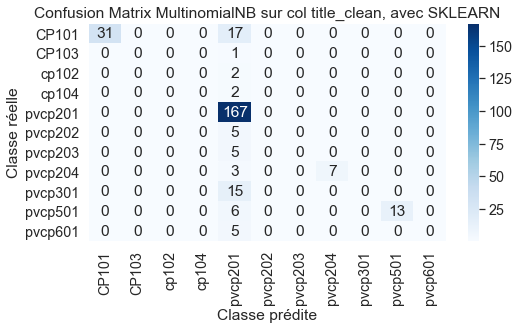

In [132]:
# Matrice de confusion
plot_matrice_confusion(y_test, y_pred, title='MultinomialNB sur col title_clean, avec SKLEARN')
plt.show()

### <span class="bg-success">4.2. BOW - TFIDF</span>

- Une transformation tf-idf (term frequency-inverse document frequency), permet de pondérer les fréquences d’apparition des termes par leur nombre d’occurrences dans l’ensemble des documents.
- La pondération tf-idf permet de contrebalancer l’importance d’un mot utilisé très fréquemment dans tous les documents du corpus par rapport aux termes plus spécifiques à certains documents. 
- TF-IDF est un produit de deux parties :
    - TF (Term Frequency) - Elle est définie comme le nombre de fois qu'un mot apparaît dans une phrase donnée.
    - IDF (Inverse Document Frequency) - Il est défini comme le logarithme à la base e du nombre total de documents divisé par les documents dans lesquels le mot apparaît.
    - Une mesure possible est la suivante (Jones 1973) :
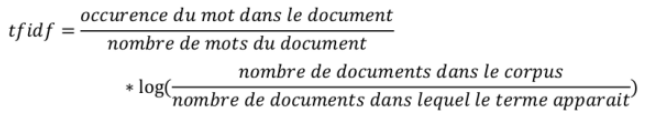
- Cette transformation permet de produire des premiers éléments d’analyses, au premier titre duquel apparaissent les nuages de mots (wordcloud) qui représentent la fréquence relative des termes et qui donnent une première idée des significations contenues dans le corpus.

[Source](https://hal.archives-ouvertes.fr/hal-02400308/document)

In [206]:
# Load Estimators
from river.linear_model import LogisticRegression
from river.naive_bayes import MultinomialNB as MNB_RIVER
from river.feature_extraction import BagOfWords,TFIDF
from sklearn import datasets
from river import stream
from river import compose
from river.compose import Pipeline
from river import linear_model
from river import optim
from river import preprocessing
from river import metrics
from river import feature_extraction

#### <span style='background:Moccasin'>MultinomialNB</span>

<span class="bg-info">Séparation du jeu de données train/test<span>

In [207]:
df_texte_clean = df_work[["texte_clean", "label"]]
df_texte_clean.head(3)

,texte_clean,label
0,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer ies feuilles présence toutes autres pièces prendre part toutes délibérations émettre votes questions mentionnées ordre jour généralement nécessaire rappelé représenter coproprié...,CP101
1,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représe...,CP101
2,recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle po...,CP101


In [208]:
df_texte_clean = df_texte_clean.astype(np.str)

In [209]:
#X = df_title_clean.drop('label', axis=1)
XT = df_texte_clean
yT = df_texte_clean.pop('label')
XT.head()

,texte_clean
0,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer ies feuilles présence toutes autres pièces prendre part toutes délibérations émettre votes questions mentionnées ordre jour généralement nécessaire rappelé représenter coproprié...
1,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représe...
2,recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle po...
3,regu travailler toute mars ep gest compte rendu gestion annuel mars immeuble residence sablons da rue sablons rue berthie bezons ff wa foncia cos conseil syndical bitar branco calado drouet latte mel harnane elient legrand reddaf clair net pr interlocuteurs foncia jean michel pimont directeur agence tél jean michel pimont foncia fr rosa martins assistante copropriété tél martins foncia fr isabelle f comptable tél isabelle fodere foncia fe q compte re...
4,\ domsxis rue saint charles bp paris cedex comptables raphael fay gestionnaire kopp société snr copropriete place cerclades cergy assemblee generale tiendra jeudi septembre adresse suivante antenne val oise domaxis immeuble soge rue verger cergy h service courtier reçu jul paris recommande r référence nombre hp olb e sophie kopp madame monsieur pouvoir effet délibérer prions bien vouloir assister ordinaire tiendra jeudi septembre h antenne val...


In [210]:
from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(XT, yT, stratify=yT,test_size = 0.2, random_state = 23)
X_train.shape, y_train.shape, X_test.shape, y_test.shape

((1115, 1), (1115,), (279, 1), (279,))

<span class="bg-info">Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)<span>

In [211]:
data_stream_texte_trainT = stream.iter_pandas(X_train, y_train)

In [212]:
from pprint import pprint
for x, y in data_stream_texte_trainT:
    pprint(x)
    pprint(y)
    break

{'texte_clean': 'sylvie da fonseca  conseil syndical quai largo quailargo '
                'conseilsyndical gmail com envoyé samedi février  quailargo '
                'conseilsyndical gmail com cc bourgetel nicolas  marie '
                'caroline objet newsletter  conseil syndical  quai largo '
                'bonjour    conseil syndical  confirme  dernière actualité   '
                'prochaines échéances  prendre  compte  souhaitant   point   '
                'craintes         assurés   ensemble    neuvième quartier '
                'agréable  vivre       bientôt  conseil syndical  pris bonne '
                'note  indications communiquées   élus   reçus  genèse  '
                'premiers riverains   marina  arrivés  pendant  confinement  '
                'côté  zones   marina     réceptionné   jour            fin   '
                'construction  bâtiment    angle  minimum  chantier fera   '
                'objet    rétrocession  eiffage vers  mairie        date  '

<span class="bg-info">Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)<span>

In [213]:
data_stream_texte_testT = stream.iter_pandas(X_test, y_test)

In [214]:
from pprint import pprint
for x, y in data_stream_texte_testT:
    pprint(x)
    pprint(y)
    break

{'texte_clean': 'socerm  habitation bureau gestion  restaurants inter '
                'entreprises assistant  bénévole achat vente gérance socerm '
                'achat vente location gérance   copropriétés bis rue hervet '
                'rueil malmaison bis rue rené cassin rueil malmaison tél fax '
                'tél fax email transaction socerm com email copropriete socerm '
                'com aful zac  godardes rueil malmaison assemblee generale  '
                'mai  h chez socerm bis rue rene cassin rueil malmaison socerm '
                'siège social bis rue rené cassin  rueil malmaison site '
                'internet www socerm com   r   capital   r   nanterre b  '
                'siret  code nace z code ape   tva cee fr cartes '
                'professionnelles gestion   transactions  délivrées   '
                'préfecture  nanterre  garanties socaf compte bancaire crédit '
                'mutuel  rueil malmaison ordre  jour nomination  president  '
       

<span class="bg-info">Modélisation - Pipeline avec RIVER<span>

In [215]:
#  Make a Pipeline
from river.compose import Pipeline
pipe_nb_2 = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

In [216]:
### Visualize the Pipeline
pipe_nb_2

Pipeline (
  TFIDF (
    normalize=True
    on="texte_clean"
    strip_accents=False
    lowercase=False
    preprocessor=None
    tokenizer=<built-in method findall of re.Pattern object at 0x000001E3178BFED0>
    ngram_range=(1, 1)
  ),
  MultinomialNB (
    alpha=1.
  )
)

In [217]:
pipe_nb_2.steps

OrderedDict([('vectorizer',
              TFIDF (
                normalize=True
                on="texte_clean"
                strip_accents=False
                lowercase=False
                preprocessor=None
                tokenizer=<built-in method findall of re.Pattern object at 0x000001E3178BFED0>
                ngram_range=(1, 1)
              )),
             ('nb',
              MultinomialNB (
                alpha=1.
              ))])

In [218]:
# Fit on our data
# Learn one at a time
# learn_one(for river)/ fit_one(for creme)
# predict_one

for text,label in data_stream_texte_trainT:
    # print(label)
    pipe_nb_2 = pipe_nb_2.learn_one(text,label)

<span class="bg-info">Essai de prédiction à partir d'une nouvelle donnée avec RIVER<span>

In [219]:
# Make Prediction
pipe_nb_2.predict_one({'texte_clean': 'zac  godardes rueil malmaison assemblee generale  '
                'mai  h chez socerm bis rue rene cassin rueil malmaison socerm '
                'siège social bis rue rené cassin  rueil malmaison site '
                'internet www socerm com   r   capital   r   nanterre b  '
                'siret  code nace z code ape   tva cee fr cartes '
                'professionnelles gestion   transactions  délivrées   '
                'préfecture  nanterre  garanties socaf compte bancaire crédit '
                'mutuel  rueil malmaison ordre  jour nomination  president  '
                'seance nomination  er scrutateur  seance nomination  eme '
                'scrutateur  seance'})

'pvcp201'

In [220]:
# Make Prediction
pipe_nb_2.predict_proba_one({'texte_clean': 'zac  godardes rueil malmaison assemblee generale  '
                'mai  h chez socerm bis rue rene cassin rueil malmaison socerm '
                'siège social bis rue rené cassin  rueil malmaison site '
                'internet www socerm com   r   capital   r   nanterre b  '
                'siret  code nace z code ape   tva cee fr cartes '
                'professionnelles gestion   transactions  délivrées   '
                'préfecture  nanterre  garanties socaf compte bancaire crédit '
                'mutuel  rueil malmaison ordre  jour nomination  president  '
                'seance nomination  er scrutateur  seance nomination  eme '
                'scrutateur  seance'})

{'pvcp501': 0.0008912095256540848,
 'CP101': 0.04332865392051741,
 'pvcp201': 0.9534230599851695,
 'pvcp301': 0.0017956467986409116,
 'cp104': 3.837619710562395e-05,
 'pvcp202': 8.907294700173139e-05,
 'pvcp203': 9.657194899988622e-05,
 'cp102': 3.8013914128745014e-05,
 'pvcp204': 0.0002271942769999184,
 'pvcp601': 6.054647796995673e-05,
 'CP103': 1.1654007810386705e-05}

<span class="bg-info">Prédiction avec RIVER<span>

In [221]:
y_pred = []
for x,y in data_stream_texte_testT:
    #print(x)
    res = pipe_nb_2.predict_one(x)
    y_pred.append(res)

In [148]:
#print(y_test)

In [149]:
#print(y_pred)

In [222]:
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

In [223]:
# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_texte_testT:
    print(x)
    res = pipe_nb_2.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

In [152]:
report

           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.597    1.000   0.748       166  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.597    0.597   0.597            
Weighted       0.357    0.597   0.446            

                 59.7% accuracy                  

<span class="bg-info">Essais TFIDF<span>

In [224]:
#####################################     TFIDF   Colonne texte_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', "label"]]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='texte_clean',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 2) (1115,) (279, 2) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [154]:
#####################################     TFIDF   Colonne texte_clean_stem      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_stem', "label"]]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='texte_clean_stem',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 3) (1115,) (279, 3) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [155]:
#####################################     TFIDF   Colonne texte_clean_lemma      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='texte_clean_lemma',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 3) (1115,) (279, 3) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [156]:
############################     TFIDF   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [157]:
############################     TFIDF   Colonnes "Title+Texte" = texte_clean_stem + title_stem      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_stem"] + " " + df_work["texte_clean_stem"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [158]:
############################     TFIDF   Colonnes "Title+Texte" = texte_clean_lemma + title_lemma      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_lemma"] + " " + df_work["texte_clean_lemma"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('nb', MNB_RIVER()))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

#### <span style='background:Moccasin'>AdaptiveRandomForestClassifier</span>

In [159]:
from river import synth
from river.ensemble import AdaptiveRandomForestClassifier
from river.ensemble import AdaBoostClassifier
from river import evaluate
from river import metrics

In [160]:
# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

In [161]:
X.head(1)

,title_clean,texte_clean,texte_clean_lemma,Title+Texte
0,cp sy convoc ago convocation ag pdf,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer ies feuilles présence toutes autres pièces prendre part toutes délibérations émettre votes questions mentionnées ordre jour généralement nécessaire rappelé représenter coproprié...,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bi rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer y feuilles présence toutes autres pièces prendre part toutes délibérations émettre vote question mentionnées ordre jour généralement nécessaire rappelé représenter copropriétaire chacun recevoir trois pouvoirs recevoir plus t...,cp sy convoc ago convocation ag pdf adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bis rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer ies feuilles présence toutes autres pièces prendre part toutes délibérations émettre votes questions mentionnées ordre jour généralement nécessaire ...
1,cp sy convoc ago pdf,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représe...,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représentant recevoir pouvoir blanc utilisation mandataire recevoir plus trois pou...,cp sy convoc ago pdf recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rap...
2,cp sy convoc ago convoc ag pdf,recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle po...,recommandee ar immeuble dome rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés po...,cp sy convoc ago convoc ag pdf recommandee ar immeuble domes rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation a

In [162]:
############################     BagOfWords   Colonnes "Title+Texte" = texte_clean + title_clean      ###################################################


# Dataframe de travail
df_clean = df_work[["title_clean", 'texte_clean', 'texte_clean_lemma', "label"]]
df_clean["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_clean = df_clean.astype(np.str)

# Préparation du dataframe
X = df_clean
y = df_clean.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('rf', AdaptiveRandomForestClassifier(n_models=20, max_features=1000, seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 4) (1115,) (279, 4) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [163]:
#########    TFIDF/AdaptiveRandomForestClassifier   Colonnes "Title+Texte" = texte_clean + title_clean    ###########


# Dataframe de travail
df_rf = df_work.copy()
df_rf["Title+Texte"] = df_work["title_clean"] + " " + df_work["texte_clean"]
df_rf = df_rf.astype(np.str)

# Préparation du dataframe
X = df_rf
y = X.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('rf', AdaptiveRandomForestClassifier(n_models=5,max_features=1000, seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 9) (1115,) (279, 9) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [164]:
#########    Bagofwords/AdaptiveRandomForestClassifier   Colonnes "Title+Texte" = texte_clean_stem + title_stem     ###########


# Dataframe de travail
df_rf = df_work.copy()
df_rf["Title+Texte"] = df_work["title_stem"] + " " + df_work["texte_clean_stem"]
df_rf = df_rf.astype(np.str)

# Préparation du dataframe
X = df_rf
y = X.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.BagOfWords(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('rf', AdaptiveRandomForestClassifier(n_models=3, max_features=1000,  seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 9) (1115,) (279, 9) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [165]:
#########    TFIDF/AdaptiveRandomForestClassifier   Colonnes "Title+Texte" = texte_clean_stem + title_stem     ###########


# Dataframe de travail
df_rf = df_work.copy()
df_rf["Title+Texte"] = df_work["title_stem"] + " " + df_work["texte_clean_stem"]
df_rf = df_rf.astype(np.str)

# Préparation du dataframe
X = df_rf
y = X.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('rf', AdaptiveRandomForestClassifier(n_models=3, seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 9) (1115,) (279, 9) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [166]:
#########    TFIDF/AdaptiveRandomForestClassifier   Colonnes "Title+Texte" = texte_clean_lemma + title_lemma     ###########


# Dataframe de travail
df_rf = df_work.copy()
df_rf["Title+Texte"] = df_work["title_lemma"] + " " + df_work["texte_clean_lemma"]
df_rf = df_rf.astype(np.str)

# Préparation du dataframe
X = df_rf
y = X.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('rf', AdaptiveRandomForestClassifier(n_models=10, max_features=1000, seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 9) (1115,) (279, 9) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

In [167]:
#########    TFIDF/AdaptiveRandomForestClassifier   Colonnes "Title+Texte" = texte_clean_lemma + title_lemma     ###########


# Dataframe de travail
df_rf = df_work.copy()
df_rf["Title+Texte"] = df_work["title_lemma"] + " " + df_work["texte_clean_lemma"]
df_rf = df_rf.astype(np.str)

# Préparation du dataframe
X = df_rf
y = X.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('rf', AdaptiveRandomForestClassifier(n_models=15,max_features=1000, seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 9) (1115,) (279, 9) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

#### <span style='background:Moccasin'>AdaBoostClassifier</span>

In [168]:
#########    AdaBoostClassifier   Colonnes "Title+Texte" = texte_clean_lemma + title_lemma     ###########


# Dataframe de travail
df_ada = df_work.copy()
df_ada["Title+Texte"] = df_work["title_lemma"] + " " + df_work["texte_clean_lemma"]
df_ada = df_ada.astype(np.str)

# Préparation du dataframe
X = df_ada
y = X.pop('label')

from sklearn.model_selection import train_test_split
# split the dataset into test set and train set
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,test_size = 0.2, random_state = 23)
print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

# Préparation du jeu de données TRAIN pour river (dictionnaire, iter_pandas)
data_stream_train = stream.iter_pandas(X_train, y_train)

# Préparation du jeu de données TEST pour river (dictionnaire, iter_pandas)
data_stream_test = stream.iter_pandas(X_test, y_test)

#  Make a Pipeline
from river.compose import Pipeline
pipe_nb = Pipeline(('vectorizer', river.feature_extraction.TFIDF(on='Title+Texte',strip_accents=False, lowercase=False)),
                   ('ada', AdaptiveRandomForestClassifier(n_models=15, max_features=1000, seed=42)))

# Fit on our data
# Learn one at a time
for text,label in data_stream_train:
    pipe_nb = pipe_nb.learn_one(text,label)
    
# Predict
y_pred = []
for x,y in data_stream_test:
    res = pipe_nb.predict_one(x)
    y_pred.append(res)

#Classification report
report = ClassificationReport()

for yt,yp in zip(y_test,y_pred):
    report = report.update(yt,yp)

# Get y_true/y_test
y_pred = []
y_test = []
for x,y in data_stream_test:
    print(x)
    res = pipe_nb.predict_one(x)
    y_pred.append(res)
    y_test.append(y)

report

(1115, 9) (1115,) (279, 9) (279,)


           Precision   Recall   F1      Support  
                                                 
   CP101       0.000    0.000   0.000        48  
   CP103       0.000    0.000   0.000         1  
   cp102       0.000    0.000   0.000         2  
   cp104       0.000    0.000   0.000         2  
 pvcp201       0.599    1.000   0.749       167  
 pvcp202       0.000    0.000   0.000         5  
 pvcp203       0.000    0.000   0.000         5  
 pvcp204       0.000    0.000   0.000         1  
 pvcp301       0.000    0.000   0.000        15  
 pvcp501       0.000    0.000   0.000        19  
 pvcp601       0.000    0.000   0.000         5  
                                                 
   Macro       0.054    0.091   0.068            
   Micro       0.599    0.599   0.599            
Weighted       0.358    0.599   0.448            

                 59.9% accuracy                  

#### <span style='background:Moccasin'>progressive_val_score</span>

**Évalue la performance d'un modèle sur un jeu de données en streaming.**

Cette méthode est la manière canonique d'évaluer la performance d'un modèle. 

Elle permet d'évaluer exactement comment un modèle aurait fonctionné dans un scénario de production.

- [x] Le `dataset` est converti en un flux de questions et de réponses. A chaque étape, il est demandé au modèle soit de prédire une observation, soit il est mis à jour. 
- [x] La cible n'est révélée au modèle qu'après un certain temps, qui est déterminé par le paramètre `delay`. Notez que sous le capot, la fonction `stream.simulate_qa` fonctionne pour parcourir les données dans l'ordre d'arrivée.
- [x] Par défaut, il n'y a pas de délai, ce qui signifie que les échantillons sont traités les uns après les autres. Lorsqu'il n'y a pas de délai, cette fonction effectue essentiellement une validation progressive. Lorsqu'il y a un délai, on parle alors de validation progressive retardée. Il est conseillé d'utiliser le paramètre `delay` afin d'obtenir une évaluation fiable.En effet, dans un scénario de production, il arrive souvent que les vérités de base soient mises à disposition après un certain temps. En utilisant cette méthode, vous pouvez reproduire ce scénario et donc évaluer fidèlement les performances d'un modèle sur un jeu de données.

In [186]:
from river import synth
from river import ensemble
from river import evaluate
from river import metrics
from river import tree

# Dataframe de travail
df_nb = df_work[['title_lemma', 'label']]
df_nb = df_nb.astype(np.str)

# Encodage

# LabelEncoder
from sklearn.preprocessing import LabelEncoder
# creating instance of labelencoder
labelencoder = LabelEncoder()
# Assigning numerical values and storing in another column
df_nb['label'] = labelencoder.fit_transform(df_nb['label'])

# OneHotEncoder
from sklearn.preprocessing import OneHotEncoder
df_nb.reset_index(inplace=True, drop=True)
ohc = OneHotEncoder()
ohe = ohc.fit_transform(df_nb.title_lemma.values.reshape(-1,1)).toarray()
df_one_hot = pd.DataFrame(ohe, columns = ['Title_'+str(ohc.categories_[0][i])
                                          for i in range(len(ohc.categories_[0]))])
df_nb = pd.concat([df_nb, df_one_hot], axis=1)

# Préparation data
X = df_nb.drop(['title_lemma', 'label'], axis=1)
y = df_nb.pop('label')

# Préparation du jeu de données pour river (dictionnaire, iter_pandas)
data_stream = stream.iter_pandas(X, y)


model = ensemble.AdaptiveRandomForestClassifier(
    n_models=5, seed=42)

metric = metrics.Accuracy()

evaluate.progressive_val_score(data_stream, model, metric)

Accuracy: 85.36%

In [187]:
model

AdaptiveRandomForestClassifier (
  n_models=5
  max_features=21
  lambda_value=6
  metric=Accuracy (
    cm=ConfusionMatrix ()
  )
  disable_weighted_vote=False
  drift_detector=ADWIN (
    delta=0.001
  )
  warning_detector=ADWIN (
    delta=0.01
  )
  grace_period=50
  max_depth=None
  split_criterion="info_gain"
  split_confidence=0.01
  tie_threshold=0.05
  leaf_prediction="nba"
  nb_threshold=0
  nominal_attributes=None
  splitter=None
  binary_split=False
  max_size=32
  memory_estimate_period=2000000
  stop_mem_management=False
  remove_poor_attrs=False
  merit_preprune=True
  seed=42
)

## <span class="bg-info">5. Annexes</span>

#### <span style='background:Moccasin'>OFFLINE ML SKLEARN</span>

https://towardsdatascience.com/multi-class-text-classification-with-scikit-learn-12f1e60e0a9f

In [188]:
from io import StringIO
col = ['label', 'texte_clean_lemma']
df = df_work[col]
df = df[pd.notnull(df['texte_clean_lemma'])]
df.columns = ['label', 'texte_clean_lemma']
df['category_id'] = df['label'].factorize()[0]
category_id_df = df[['label', 'category_id']].drop_duplicates().sort_values('category_id')
category_to_id = dict(category_id_df.values)
id_to_category = dict(category_id_df[['category_id', 'label']].values)
df.head()

,label,texte_clean_lemma,category_id
0,CP101,adresse immeuble afut murat place maitres vignerons rueil mandat membre aful ogif bi rue villiers levallois perret pouvoir soussigné agissant qualité copropriétaire immeuble précité constitue mandataire défaut représenter aful murat septembre conséquence assister signer y feuilles présence toutes autres pièces prendre part toutes délibérations émettre vote question mentionnées ordre jour généralement nécessaire rappelé représenter copropriétaire chacun recevoir trois pouvoirs recevoir plus t...,0
1,CP101,recommandee ar immeuble convocation ordinaire madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi juin h foncia seine ouest rue maurice bokanoswki asnieres seine effet délibérer ordre jour joint conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés pouviez présent possible représenter aide pouvoir joint rappelons représentant recevoir pouvoir blanc utilisation mandataire recevoir plus trois pou...,0
2,CP101,recommandee ar immeuble dome rst rue hauts chanturgue rue torpilleur sirocco clermont ferrand convocation annuelle madame mademoiselle monsieur remercions bien vouloir participer tiendra lundi mai h site leclanche salle rue champratel clermont ferrand rec avr effet délibérer ordre jour joint résolutions nécessitent majorité loi résolutions nécessitent majorité loi conséquence important présents représentés défaut majorité nouvelle pourrait tenue génératrice frais supplémentaires supportés po...,0
3,CP101,regu travailler toute mar ep gest compte rendu gestion annuel mar immeuble residence sablons da rue sablons rue berthie bezons ff wa foncia co conseil syndical bitar branco calado drouet latte mel harnane elient legrand reddaf clair net pr interlocuteurs foncia jean michel pimont directeur agence tél jean michel pimont foncia fr rosa martin assistante copropriété tél martin foncia fr isabelle f comptable tél isabelle fodere foncia fe q compte rendu gestion copropriété annuel chère madame che...,0
4,CP101,\ domsxis rue saint charles bp paris cedex comptables raphael fay gestionnaire kopp société snr copropriete place cerclades cergy assemblee generale tiendra jeudi septembre adresse suivante antenne val oise domaxis immeuble soge rue verger cergy h service courtier reçu jul paris recommande r référence nombre hp olb e sophie kopp madame monsieur pouvoir effet délibérer prion bien vouloir assister ordinaire tiendra jeudi septembre h antenne val oise domaxis immeuble rue verger cergy ordre jour...,0


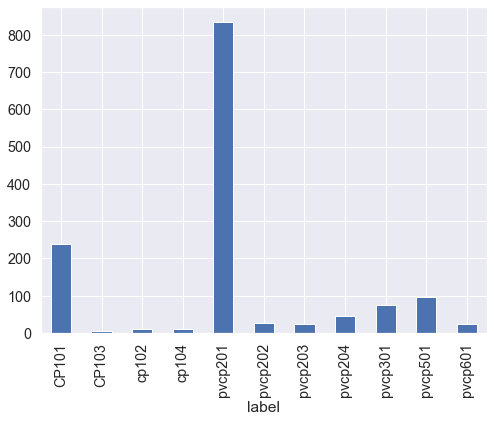

In [189]:
import matplotlib.pyplot as plt
fig = plt.figure(figsize=(8,6))
df_work.groupby('label').texte_clean_lemma.count().plot.bar(ylim=0)
plt.show()

In [190]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(sublinear_tf=True, min_df=5, norm='l2', ngram_range=(1, 3))
features = tfidf.fit_transform(df_work.texte_clean_lemma).toarray()
labels = df_work.label
features.shape

(1394, 99600)

In [191]:
from sklearn.feature_selection import chi2
import numpy as np
N = 2
for label, category_id in sorted(category_to_id.items()):
    features_chi2 = chi2(features, labels == category_id)
    indices = np.argsort(features_chi2[0])
    feature_names = np.array(tfidf.get_feature_names())[indices]
    unigrams = [v for v in feature_names if len(v.split(' ')) == 1]
    bigrams = [v for v in feature_names if len(v.split(' ')) == 2]
    trigrams = [v for v in feature_names if len(v.split(' ')) == 3]
    print("# '{}':".format(label))
    print("  . Most correlated unigrams:\n. {}".format('\n. '.join(unigrams[-N:])))
    print("  . Most correlated bigrams:\n. {}".format('\n. '.join(bigrams[-N:])))
    print("  . Most correlated trigrams:\n. {}".format('\n. '.join(trigrams[-N:])))

# 'CP101':
  . Most correlated unigrams:
. entraînant
. entravent
  . Most correlated bigrams:
. entraîne cessation
. entre appartements
  . Most correlated trigrams:
. entraîne cessation plein
. œuvré service disponible
# 'CP103':
  . Most correlated unigrams:
. entraînant
. entravent
  . Most correlated bigrams:
. entraîne cessation
. entre appartements
  . Most correlated trigrams:
. entraîne cessation plein
. œuvré service disponible
# 'cp102':
  . Most correlated unigrams:
. entraînant
. entravent
  . Most correlated bigrams:
. entraîne cessation
. entre appartements
  . Most correlated trigrams:
. entraîne cessation plein
. œuvré service disponible
# 'cp104':
  . Most correlated unigrams:
. entraînant
. entravent
  . Most correlated bigrams:
. entraîne cessation
. entre appartements
  . Most correlated trigrams:
. entraîne cessation plein
. œuvré service disponible
# 'pvcp201':
  . Most correlated unigrams:
. entraînant
. entravent
  . Most correlated bigrams:
. entraîne cessatio

In [192]:
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.naive_bayes import MultinomialNB
X_train, X_test, y_train, y_test = train_test_split(df_work['texte_clean_lemma'], df_work['label'], random_state = 0)
count_vect = CountVectorizer()
X_train_counts = count_vect.fit_transform(X_train)
tfidf_transformer = TfidfTransformer()
X_train_tfidf = tfidf_transformer.fit_transform(X_train_counts)
clf = MultinomialNB().fit(X_train_tfidf, y_train)

In [193]:
# Prediction
print(clf.predict(count_vect.transform(["regu travailler toute mar ep gest compte rendu gestion annuel mar immeuble residence sablons da rue sablons rue berthie bezons ff wa foncia co conseil syndical bitar branco calado drouet latte mel harnane elient legrand reddaf clair net pr interlocuteurs foncia jean michel pimont directeur agence tél jean michel pimont foncia fr rosa"])))

['pvcp201']


In [194]:
df_work[df_work['texte_clean_lemma'] == "regu travailler toute mar ep gest compte rendu gestion annuel mar immeuble residence sablons da rue sablons rue berthie bezons ff wa foncia co conseil syndical bitar branco calado drouet latte mel harnane elient legrand reddaf clair net pr interlocuteurs foncia jean michel pimont directeur agence tél jean michel pimont foncia fr rosa"]

,title,texte,label,texte_clean,texte_clean_stem,texte_clean_lemma,title_clean,title_stem,title_lemma


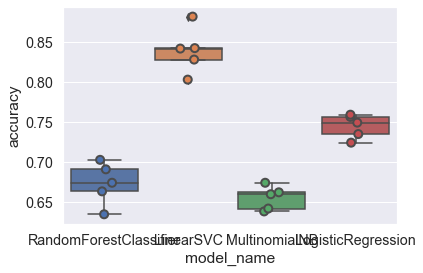

In [195]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.model_selection import cross_val_score
models = [
    RandomForestClassifier(n_estimators=200, max_depth=3, random_state=0),
    LinearSVC(),
    MultinomialNB(),
    LogisticRegression(random_state=0),
]
CV = 5
cv_df = pd.DataFrame(index=range(CV * len(models)))
entries = []
for model in models:
    model_name = model.__class__.__name__
    accuracies = cross_val_score(model, features, labels, scoring='accuracy', cv=CV)
    for fold_idx, accuracy in enumerate(accuracies):
        entries.append((model_name, fold_idx, accuracy))
cv_df = pd.DataFrame(entries, columns=['model_name', 'fold_idx', 'accuracy'])

import seaborn as sns
sns.boxplot(x='model_name', y='accuracy', data=cv_df)
sns.stripplot(x='model_name', y='accuracy', data=cv_df, 
              size=8, jitter=True, edgecolor="gray", linewidth=2)
plt.show()

In [196]:
cv_df

,model_name,fold_idx,accuracy
0,RandomForestClassifier,0,0.7025
1,RandomForestClassifier,1,0.6631
2,RandomForestClassifier,2,0.6738
3,RandomForestClassifier,3,0.6344
4,RandomForestClassifier,4,0.6906
5,LinearSVC,0,0.8817
6,LinearSVC,1,0.8029
7,LinearSVC,2,0.8280
8,LinearSVC,3,0.8423
9,LinearSVC,4,0.8417


In [197]:
cv_df.groupby('model_name').accuracy.mean()

model_name
LinearSVC                 0.8393
LogisticRegression        0.7446
MultinomialNB             0.6550
RandomForestClassifier    0.6729
Name: accuracy, dtype: float64

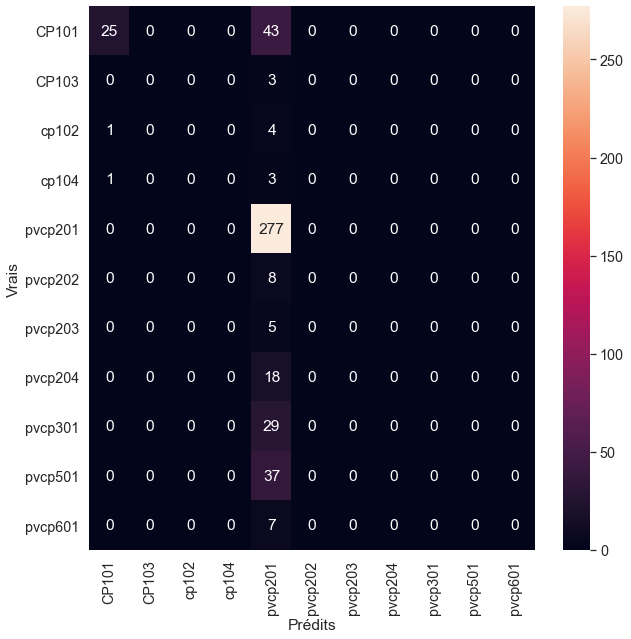

In [198]:
model = MultinomialNB()
X_train, X_test, y_train, y_test, indices_train, indices_test = train_test_split(features, labels, df.index, test_size=0.33, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(conf_mat, annot=True, fmt='d',
            xticklabels=category_id_df.label.values, yticklabels=category_id_df.label.values)
plt.ylabel('Vrais')
plt.xlabel('Prédits')
plt.show()

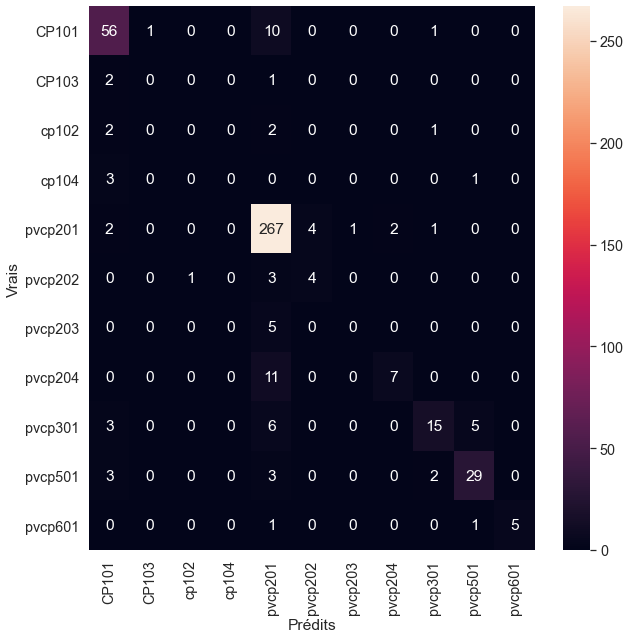

In [199]:
model = LinearSVC()
X_train, X_test, y_train, y_test, indices_train, indices_test = train_test_split(features, labels, df.index, test_size=0.33, random_state=0)
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
from sklearn.metrics import confusion_matrix
conf_mat = confusion_matrix(y_test, y_pred)
fig, ax = plt.subplots(figsize=(10,10))
sns.heatmap(conf_mat, annot=True, fmt='d',
            xticklabels=category_id_df.label.values, yticklabels=category_id_df.label.values)
plt.ylabel('Vrais')
plt.xlabel('Prédits')
plt.show()

In [200]:
from IPython.display import display
for predicted in category_id_df.category_id:
    for actual in category_id_df.category_id:
        if predicted != actual and conf_mat[actual, predicted] >= 10:
            print("'{}' predicted as '{}' : {} examples.".format(id_to_category[actual], id_to_category[predicted], conf_mat[actual, predicted]))
            display(df.loc[indices_test[(y_test == actual) & (y_pred == predicted)]][['label', 'texte_clean_lemma']])
            print('')

'CP101' predicted as 'pvcp201' : 10 examples.


,label,texte_clean_lemma



'pvcp204' predicted as 'pvcp201' : 11 examples.


,label,texte_clean_lemma


In [201]:
model.fit(features, labels)
N = 2
for label, category_id in sorted(category_to_id.items()):
    indices = np.argsort(model.coef_[category_id])
    feature_names = np.array(tfidf.get_feature_names())[indices]
    unigrams = [v for v in reversed(feature_names) if len(v.split(' ')) == 1][:N]
    bigrams = [v for v in reversed(feature_names) if len(v.split(' ')) == 2][:N]
    print("# '{}':".format(label))
    print("  . Top unigrams:\n       . {}".format('\n       . '.join(unigrams)))
    print("  . Top bigrams:\n       . {}".format('\n       . '.join(bigrams)))

# 'CP101':
  . Top unigrams:
       . qp
       . eugene
  . Top bigrams:
       . hp hp
       . hp logements
# 'CP103':
  . Top unigrams:
       . lieusaint
       . spéciale
  . Top bigrams:
       . projets décisions
       . contexte sanitaire
# 'cp102':
  . Top unigrams:
       . mathis
       . fugue
  . Top bigrams:
       . mathis paris
       . rue mathis
# 'cp104':
  . Top unigrams:
       . versailles
       . asl
  . Top bigrams:
       . disposition ca
       . chapitre iii
# 'pvcp201':
  . Top unigrams:
       . di
       . hp
  . Top bigrams:
       . résolution adoptée
       . proces verbal
# 'pvcp202':
  . Top unigrams:
       . extraordinaire
       . pv
  . Top bigrams:
       . verbal extraordinaire
       . domaine ferme
# 'pvcp203':
  . Top unigrams:
       . votent
       . èmes
  . Top bigrams:
       . ex rrp
       . votent contre
# 'pvcp204':
  . Top unigrams:
       . souscrire
       . constitutive
  . Top bigrams:
       . logements di
       . souscrire

In [202]:
from sklearn import metrics
print(metrics.classification_report(y_test, y_pred, target_names=df['label'].unique()))

              precision    recall  f1-score   support

       CP101       0.79      0.82      0.81        68
       CP103       0.00      0.00      0.00         3
       cp102       0.00      0.00      0.00         5
       cp104       0.00      0.00      0.00         4
     pvcp201       0.86      0.96      0.91       277
     pvcp202       0.50      0.50      0.50         8
     pvcp203       0.00      0.00      0.00         5
     pvcp204       0.78      0.39      0.52        18
     pvcp301       0.75      0.52      0.61        29
     pvcp501       0.81      0.78      0.79        37
     pvcp601       1.00      0.71      0.83         7

    accuracy                           0.83       461
   macro avg       0.50      0.43      0.45       461
weighted avg       0.80      0.83      0.81       461

